<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" 
alt="CLRSWY" style="display:block; margin:auto;"></p>

<p style="background-color:romance; color:plum; font-size:220%; text-align:center; border-radius:10px 10px; font-family:newtimeroman; line-height:1.4; font-weight:bold; text-transform: uppercase;">WAY TO REINVENT YOURSELF</p>

<p style="text-align: center;"><img src="https://storage.googleapis.com/kaggle-datasets-images/504308/932986/ef38c9d738d2e0dbeec85212f90c608e/dataset-cover.png?t=2020-02-09-00-36-15" style="display:block; margin:auto; border:1px solid LightGrey; width:80%; height:300px;"></p>

<p style="background-color:romance; color:jaguar; text-align:center; border-radius:10px 10px; font-family:newtimeroman; font-weight:bolder; font-size:3em; line-height:1.4; text-transform:capitalize;"><strong>US Army Anthropometric Working Databases (ANSUR II)</strong></p>

<p style="background-color:romance; color:jaguar; text-align:center; border-radius:10px 10px; font-family:newtimeroman; font-weight:normal; font-size:2em; line-height:1.4; text-transform:capitalize;">Multi-Class Classification problems with EDA</p> 

<basefont size="2" face ="arial, verdana, sans-serif" color="jaguar">

**WELCOME!**

In this project, you must apply EDA processes for the development of predictive models. Handling outliers, domain knowledge and feature engineering will be challenges.

Also, this project aims to improve your ability to implement algorithms for Multi-Class Classification. Thus, you will have the opportunity to implement many algorithms commonly used for Multi-Class Classification problems.

Before diving into the project, please take a look at the determines and tasks.

**Determines**

The 2012 US Army Anthropometric Survey (ANSUR II) was executed by the Natick Soldier Research, Development and Engineering Center (NSRDEC) from October 2010 to April 2012 and is comprised of personnel representing the total US Army force to include the US Army Active Duty, Reserves, and National Guard. In addition to the anthropometric and demographic data described below, the ANSUR II database also consists of 3D whole body, foot, and head scans of Soldier participants. These 3D data are not publicly available out of respect for the privacy of ANSUR II participants. The data from this survey are used for a wide range of equipment design, sizing, and tariffing applications within the military and has many potential commercial, industrial, and academic applications.

The ANSUR II working databases contain 93 anthropometric measurements which were directly measured, and 15 demographic/administrative variables explained below. The ANSUR II Male working database contains a total sample of 4,082 subjects. The ANSUR II Female working database contains a total sample of 1,986 subjects.


DATA DICT:
https://data.world/datamil/ansur-ii-data-dictionary/workspace/file?filename=ANSUR+II+Databases+Overview.pdf

---

To achieve high prediction success, you must understand the data well and develop different approaches that can affect the dependent variable.

Firstly, try to understand the dataset column by column using pandas module. Do research within the scope of domain (body scales, and race characteristics) knowledge on the internet to get to know the data set in the fastest way. 

You will implement ***Logistic Regression, Support Vector Machine, XGBoost, Random Forest*** algorithms. Also, evaluate the success of your models with appropriate performance metrics.

At the end of the project, choose the most successful model and try to enhance the scores with ***SMOTE*** make it ready to deploy. Furthermore, use ***SHAP*** to explain how the best model you choose works.

<a id="0">**TASKS**</a>

01. Exploratory Data Analysis (EDA)
    - Import Libraries, Load Dataset, Exploring Data
      1. *i. Import Libraries*
      2. *ii. Ingest Data*
      3. *iii. Explore Data*
      4. *iv. Outlier Detection*
      5. *v.  Drop unnecessary features*
02. Data Preprocessing
    + Scale (if needed)
    + Separete the data frame for evaluation purposes
03. Multi-class Classification
    * Import libraries
    * Implement SVM Classifer
    * Implement Decision Tree Classifier
    * Implement Random Forest Classifer
    * Implement XGBoost Classifer
    * Compare The Models

# 1. Import Libraries, Load Dataset, Exploring Data

## Import Libraries
Besides Numpy and Pandas, you need to import the necessary modules for data visualization, data preprocessing, Model building and tuning.

*Note: Check out the course materials.*

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as stats
from scipy.stats import skew, kurtosis

# to get rid of the warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Environment settings: 
pd.set_option('display.float_format', lambda x: f'{x:.4f}')
# pd.set_option('display.float_format', lambda x: '%.6f'%x)
# pd.options.display.float_format = '{:.3f}'.format
# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)
# Set it None to display all rows in the dataframe
pd.set_option('display.max_rows', 100)

In [2]:
# The style parameters control properties like the color of the background and whether a grid is enabled by default.
sns.set_style("whitegrid", {'axes.grid' : False})
# sns.set_style("whitegrid")

params = {
'figure.figsize':(12,6),
'figure.titlesize':20,
'font.size': 15,
'axes.titlesize': 20,
'axes.labelsize': 15,
'xtick.labelsize': 15,
'ytick.labelsize': 15,
'legend.fontsize': 15,
'boxplot.showmeans': True,
'boxplot.meanprops.marker': 'o',
'boxplot.meanprops.markeredgecolor': 'k',
'boxplot.meanprops.markerfacecolor': 'r',
'boxplot.meanprops.markersize': 10.1,
'boxplot.medianprops.color': 'r',
'boxplot.medianprops.linewidth': 2.0,
}
plt.rcParams.update(params)
# plt.rcParams.update(plt.rcParamsDefault)
# print(plt.style.library)
# print(plt.rcParams['figure.figsize'])

In [3]:
# !pip install skimpy # update numpy automatically
# !pip install numpy==1.21.5 --user
# from skimpy import clean_columns

In [4]:
random_state=42

## Ingest Data from links below and make a dataframe
- Soldiers Male : https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr
- Soldiers Female : https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq

In [5]:
df_female_origin = pd.read_csv('https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq')
df_female = df_female_origin.copy()
df_female.head()

,SubjectId,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,Date,Installation,Component,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10037,231,1282,301,204,1180,222,177,373,315,263,466,65,338,301,141,1011,223,836,587,476,360,1336,274,922,245,1095,759,557,310,35,65,16,220,713,91,246,316,265,517,432,1028,75,182,184,141,548,191,314,69,345,388,966,645,363,399,435,496,447,55,404,118,335,368,1268,113,362,235,1062,327,148,803,809,513,1647,1560,1280,1013,622,174,736,430,110,844,1488,406,295,850,217,345,942,657,152,756,Female,5-Oct-10,Fort Hood,Regular Army,Combat Support,92Y,Germany,2,NaN,2,26,61,142,Right hand
1,10038,194,1379,320,207,1292,225,178,372,272,250,430,64,294,270,126,893,186,900,583,483,350,1440,261,839,206,1234,835,549,329,32,60,23,208,726,91,249,341,247,468,463,1117,78,187,189,138,535,180,307,60,315,335,1048,595,340,375,483,532,492,69,334,115,302,345,1389,110,426,259,1014,346,142,835,810,575,1751,1665,1372,1107,524,152,771,475,125,901,1470,422,254,708,168,329,1032,534,155,815,Female,5-Oct-10,Fort Hood,Regular Army,Combat Service Support,25U,California,3,Mexican,3,21,64,120,Right hand
2,10042,183,1369,329,233,1271,237,196,397,300,276,450,69,309,270,128,987,204,861,583,466,384,1451,287,874,223,1226,821,643,374,36,65,26,204,790,100,265,343,262,488,469,1060,84,198,195,146,588,207,331,70,356,399,1043,655,345,399,470,530,469,64,401,135,325,369,1414,122,398,258,1049,362,164,904,855,568,1779,1711,1383,1089,577,164,814,458,129,882,1542,419,269,727,159,367,1035,663,162,799,Female,5-Oct-10,Fort Hood,Regular Army,Combat Service Support,35D,Texas,1,NaN,1,23,68,147,Right hand
3,10043,261,1356,306,214,1250,240,188,384,364,276,484,68,340,294,144,1012,253,897,599,471,372,1430,269,1008,285,1170,804,640,351,38,62,22,244,775,97,265,331,309,529,455,1069,80,192,186,153,593,206,332,68,337,402,1029,655,392,435,469,520,478,67,402,118,357,386,1329,115,394,250,1121,333,157,875,815,536,1708,1660,1358,1065,679,187,736,463,125,866,1627,451,302,923,235,371,999,782,173,818,Female,5-Oct-10,Fort Hood,Regular Army,Combat Service Support,25U,District of Columbia,8,Caribbean Islander,2,22,66,175,Right hand
4,10051,309,1303,308,214,1210,217,182,378,320,336,525,67,300,295,135,1281,284,811,607,467,433,1362,305,1089,290,1112,726,686,356,34,65,18,233,732,88,247,339,260,596,447,1039,78,183,187,140,522,181,308,63

In [6]:
df_male_origin = pd.read_csv('https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr', encoding='unicode_escape')
df_male = df_male_origin.copy()
df_male.head()

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,Date,Installation,Component,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10027,266,1467,337,222,1347,253,202,401,369,274,493,71,319,291,142,979,240,882,619,509,373,1535,291,1074,259,1292,877,607,351,36,71,19,247,802,101,273,349,299,575,477,1136,90,214,193,150,583,206,326,70,332,366,1071,685,422,441,502,560,500,77,391,118,400,436,1447,113,437,273,1151,368,145,928,883,600,1782,1776,1449,1092,610,164,786,491,140,919,1700,501,329,933,240,440,1054,815,175,853,Male,4-Oct-10,Fort Hood,Regular Army,Combat Arms,19D,North Dakota,1,NaN,1,41,71,180,Right hand
1,10032,233,1395,326,220,1293,245,193,394,338,257,479,67,344,320,135,944,232,870,584,468,357,1471,269,1021,253,1244,851,615,376,33,62,18,232,781,98,263,348,289,523,476,1096,86,203,195,146,568,201,334,72,312,356,1046,620,441,447,490,540,488,73,371,131,380,420,1380,118,417,254,1119,353,141,884,868,564,1745,1702,1387,1076,572,169,822,476,120,918,1627,432,316,870,225,371,1054,726,167,815,Male,4-Oct-10,Fort Hood,Regular Army,Combat Support,68W,New York,1,NaN,1,35,68,160,Left hand
2,10033,287,1430,341,230,1327,256,196,427,408,261,544,75,345,330,135,1054,258,901,623,506,412,1501,288,1120,267,1288,854,636,359,40,61,23,237,810,103,270,355,357,575,491,1115,93,220,203,148,573,202,356,70,349,393,1053,665,462,475,496,556,482,72,409,123,403,434,1447,121,431,268,1276,367,167,917,910,604,1867,1735,1438,1105,685,198,807,477,125,918,1678,472,329,964,255,411,1041,929,180,831,Male,4-Oct-10,Fort Hood,Regular Army,Combat Support,68W,New York,2,NaN,2,42,68,205,Left hand
3,10092,234,1347,310,230,1239,262,199,401,359,262,518,73,328,309,143,991,242,821,560,437,395,1423,296,1114,262,1205,769,590,341,39,66,25,272,794,106,267,352,318,593,467,1034,91,217,194,158,576,199,341,68,338,367,986,640,458,461,460,511,452,76,393,106,407,446,1357,118,393,249,1155,330,148,903,848,550,1708,1655,1346,1021,604,180,803,445,127,847,1625,461,315,857,205,399,968,794,176,793,Male,12-Oct-10,Fort Hood,Regular Army,Combat Service Support,88M,Wisconsin,1,NaN,1,31,66,175,Right hand
4,10093,250,1585,372,247,1478,267,224,435,356,263,524,80,340,310,138,1029,275,1080,706,567,425,1684,304,1048,232,1452,1014,682,382,32,56,19,188,814,111,305,399,324,605,550,1279,94,222,218,153,566,197,374,69,332,372,1251,675,481,505,612,666,585,85,458

In [7]:
df_female.shape, df_male.shape

((1986, 108), (4082, 108))

In [8]:
df_female.info(), df_male.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1986 entries, 0 to 1985
Columns: 108 entries, SubjectId to WritingPreference
dtypes: int64(99), object(9)
memory usage: 1.6+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4082 entries, 0 to 4081
Columns: 108 entries, subjectid to WritingPreference
dtypes: int64(99), object(9)
memory usage: 3.4+ MB


(None, None)

In [9]:
df_male.info(max_cols=110)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4082 entries, 0 to 4081
Data columns (total 108 columns):
 #    Column                          Non-Null Count  Dtype 
---   ------                          --------------  ----- 
 0    subjectid                       4082 non-null   int64 
 1    abdominalextensiondepthsitting  4082 non-null   int64 
 2    acromialheight                  4082 non-null   int64 
 3    acromionradialelength           4082 non-null   int64 
 4    anklecircumference              4082 non-null   int64 
 5    axillaheight                    4082 non-null   int64 
 6    balloffootcircumference         4082 non-null   int64 
 7    balloffootlength                4082 non-null   int64 
 8    biacromialbreadth               4082 non-null   int64 
 9    bicepscircumferenceflexed       4082 non-null   int64 
 10   bicristalbreadth                4082 non-null   int64 
 11   bideltoidbreadth                4082 non-null   int64 
 12   bimalleolarbreadth              

In [10]:
# with iloc column over 100
# df_female.iloc[:, :100].info(), df_female.iloc[:, 100:].info()

In [11]:
# df_female.info(verbose=True)

<a id="1"></a>

# EDA and Graphical analysis

<!-- <a href="#0" class="btn btn-primary btn-sm" role="button" aria-pressed="true" data-toggle="popover" style="background-color:DarkOrange; color:White;">**Tasks**</a> -->

- Explore Data
- Drop unnecessary colums
- Drop **DODRace** class if **`value count below 500`** (we assume that our data model can't learn if it is below 500)

## If needed, rename the columns' names for easy use. 

In [12]:
(df_female.columns!=df_male.columns).sum()

1

In [13]:
# df_female.columns==df_male.columns
df_female.rename(columns={'SubjectId':'subjectid'}, inplace=True)

In [14]:
df = pd.concat([df_female,df_male], ignore_index=True)

In [15]:
df.shape

(6068, 108)

In [16]:
# clean_columns(df)

## Check if there are some dublicate rows or not. If there are, then drop them.

In [17]:
df.duplicated().sum()

0

## Basically check the missing values. (NaN, None)-(isna(), mean())

In [18]:
(df.isna().mean()*100).tail(10)

Branch                   0.0000
PrimaryMOS               0.0000
SubjectsBirthLocation    0.0000
SubjectNumericRace       0.0000
Ethnicity               76.5821
DODRace                  0.0000
Age                      0.0000
Heightin                 0.0000
Weightlbs                0.0000
WritingPreference        0.0000
dtype: float64

## Check the statistical values of features.

In [19]:
df.describe(include='number').style.background_gradient(cmap='PiYG', axis=1)

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,SubjectNumericRace,DODRace,Age,Heightin,Weightlbs
count,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000,6068.000000
mean,20757.198418,246.468688,1406.161338,327.374423,224.891397,1299.608767,244.192650,194.754614,399.204186,340.934245,274.735003,490.754450,72.252637,324.896506,306.636124,139.723467,1020.084707,241.619974,870.152274,608.999176,497.097561,386.041200,1477.490442,282.859097,1022.098879,251.738464,1252.013184,825.110086,621.851681,351.315920,35.132169,62.625906,22.263349,240.911338,785.914469,98.865359,263.033619,338.766645,295.010712,552.075972,467.007086,1102.049275,84.953362,203.861404,189.286585,152.182762,570.035267,196.334871,332.622940,70.756922,348.385465,385.733355,1040.059492,632.602011,412.037739,432.340804,475.512854,540.124918,483.239618,69.580422,406.479895,119.518787,375.441167,413.834707,1388.404417,113.916612,416.187047,259.192320,1129.362228,354.083553,145.072676,898.107779,866.665293,576.899967,1763.794825,1714.406065,1402.949077,1099.587179,622.198748,176.336355,789.695616,458.244562,129.617996,882.739947,1630.309492,460.524720,317.750000,914.501483,229.674028,377.003790,1031.501154,797.093935,169.002966,830.059987,17.515326,1.615030,29.761206,68.257251,174.74

In [20]:
# skewness and kurtosis
pd.concat([
    df.skew(axis=0, skipna=True), 
    df.kurtosis(axis=0, skipna=True)], 
    axis=1, keys=['skew', 'kurtosis'
]).T.style.background_gradient(cmap='PiYG', axis=1)

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,SubjectNumericRace,DODRace,Age,Heightin,Weightlbs
skew,52.623414,0.537649,-0.037748,-0.053176,0.181642,-0.015651,-0.045326,-0.078701,-0.302298,0.115389,0.112916,-0.010490,-0.000369,-0.105036,-0.004844,0.061248,0.282503,0.336287,0.150694,0.031103,0.070895,0.253383,-0.133372,0.060670,0.133493,0.199114,-0.185988,0.029905,0.253641,0.166374,0.127225,0.167010,0.316401,-0.059293,-0.087379,-0.001125,-0.143687,-0.077326,-0.030459,0.089330,-0.070356,-0.061214,-0.146816,-0.203227,0.065620,0.122145,0.021217,-0.194508,-0.096150,0.269604,0.383249,0.416372,0.028303,0.020359,0.052141,-0.027365,0.045516,-0.025167,0.033235,-0.060088,0.322532,-0.001918,-0.058184,-0.055766,-0.076794,0.134487,-0.065105,-0.058789,-0.116063,-0.079155,-0.014825,-0.104895,-0.212805,-0.056425,-0.108644,-0.107023,-0.082292,0.066725,0.246936,0.349792,-0.026264,0.075707,-0.143573,0.148685,0.155561,-0.086036,0.259159,0.349817,0.571923,0.245479,-0.031732,0.444230,-0.143129,0.058904,74.930395,1.967474,0.794666,-0.015527,0.385674
kurtosis,3596.384466,0.225841,-0.225429,-0.047272,0.165158,-0.143603,-0.287518,-0.296185,-0.505099,-0.241069,0.272966,-0.324651,-0.332766,-0.154092,-0.235837,-0.162532,0.195000,0.000696,0.083518,0.018887,0.037385,0.177820,-0.338496,-0.081260,-0.230900,-0.054670,-0.319860,-0.045149,0.087267,-0.087938,0.017441,-0.093229,0.011075,-0.100613,-0.300773,-0.093477,-0.362880,-0.215704,-0.482571,-0.455368,-0.159518,-0.174225,-0.542130,-0.646496,0.025116,0.198153,0.063216,-0.073644,-0.378314,0.152490,0.528238,0.424732,-0.013142,0.229962,-0.334253,-0.351040,-0.043863,-0.103271,0.131642,-0.287355,0.464879,-0.219385,-0.666629,-0.627160,-0.322632,-0.040935,-0.168641,-0.135637,-0.583740,-0.184060,-0.210000,-0.331808,-0.398248,-0.137528,-0.229535,-0.310826,-0.266694,-0.062578,0.305754,0.358680,-0.091710,0.050139,0.034435,0.104929,-0.166873,-0.271190,-0.093903,-0.092856,0.264205,-0.129959,-0.142382,0.147352,-0.529350,-0.141249,5748.817157,4.606197,-0.201194,0.087736,0.172109


- subjectid, SubjectNumericRace

In [21]:
df.describe(include='O').T

,count,unique,top,freq
Gender,6068,2,Male,4082
Date,6068,253,27-Feb-12,45
Installation,6068,12,Camp Shelby,1160
Component,6068,3,Regular Army,3140
Branch,6068,3,Combat Service Support,3174
PrimaryMOS,6068,285,11B,671
SubjectsBirthLocation,6068,152,California,446
Ethnicity,1421,209,Mexican,357
WritingPreference,6068,3,Right hand,5350


In [22]:
df.groupby(["Component"])["DODRace"].value_counts(normalize=True)

Component            DODRace
Army National Guard  1         0.6850
                     2         0.1843
                     3         0.0934
                     4         0.0222
                     5         0.0089
                     6         0.0063
Army Reserve         1         0.5182
                     2         0.2364
                     3         0.1864
                     4         0.0409
                     6         0.0136
                     5         0.0045
Regular Army         1         0.5806
                     2         0.2379
                     3         0.1226
                     4         0.0379
                     6         0.0124
                     5         0.0076
                     8         0.0010
Name: DODRace, dtype: float64

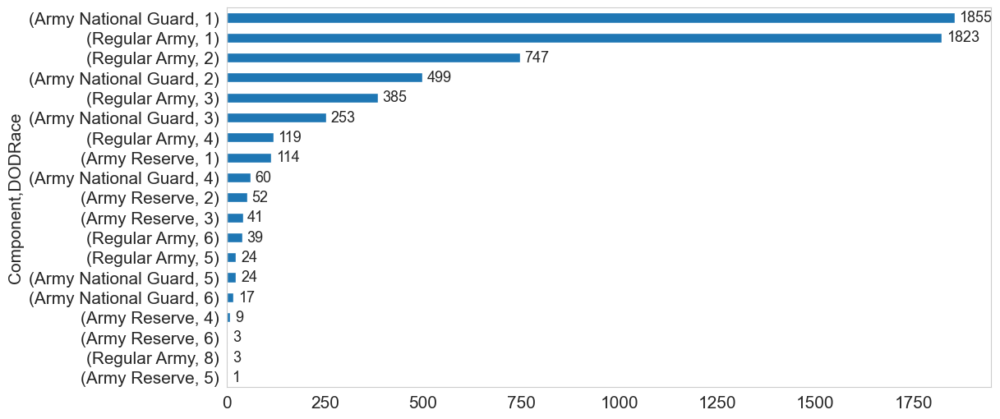

In [23]:
g = df.groupby(["Component"])["DODRace"].value_counts().sort_values().plot.barh()
g.bar_label(g.containers[0], padding=4, fontsize=13);

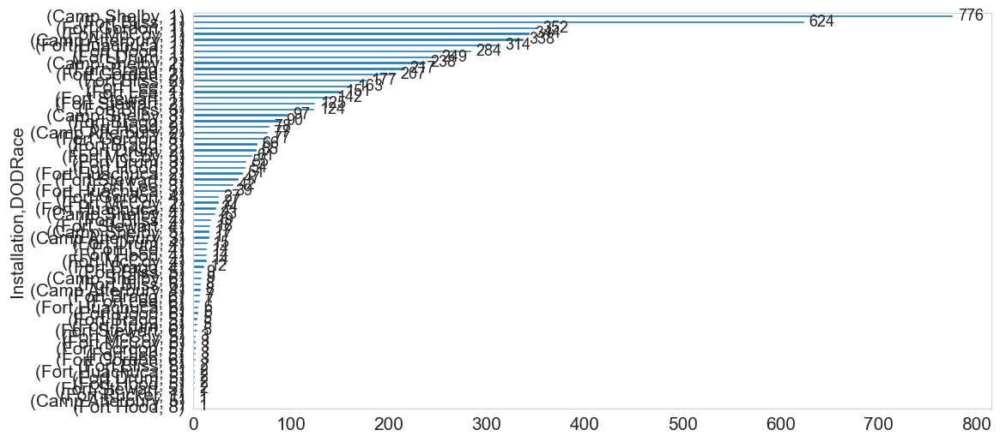

In [24]:
g = df.groupby(["Installation"])["DODRace"].value_counts().sort_values().plot.barh()
g.bar_label(g.containers[0], padding=4, fontsize=13);

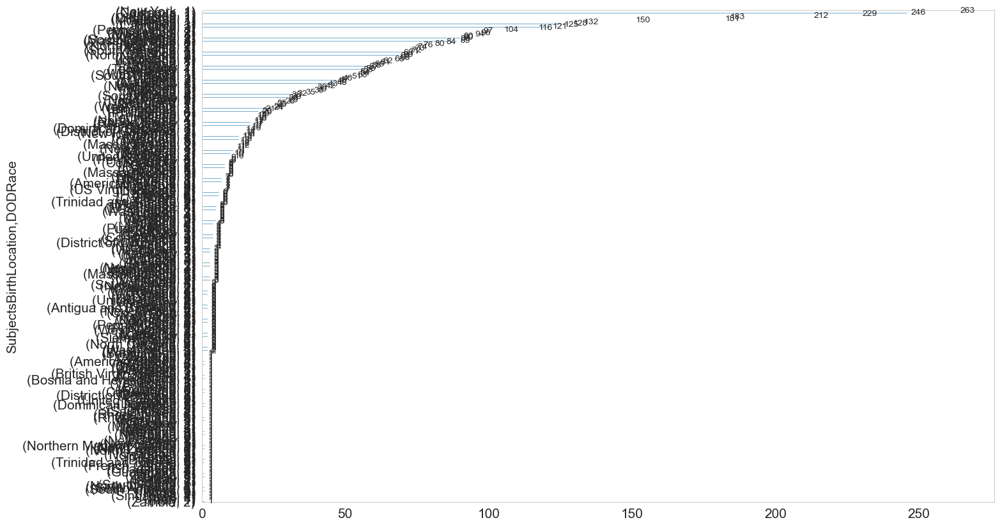

In [25]:
g = df.groupby(["SubjectsBirthLocation"])["DODRace"].value_counts().sort_values().plot.barh(figsize=(16,10))
g.bar_label(g.containers[0], padding=4, fontsize=10);

In [26]:
df[df['SubjectNumericRace']!=df['DODRace']].shape

(806, 108)

In [27]:
print(df.columns.to_list())

['subjectid', 'abdominalextensiondepthsitting', 'acromialheight', 'acromionradialelength', 'anklecircumference', 'axillaheight', 'balloffootcircumference', 'balloffootlength', 'biacromialbreadth', 'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth', 'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc', 'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth', 'buttockheight', 'buttockkneelength', 'buttockpopliteallength', 'calfcircumference', 'cervicaleheight', 'chestbreadth', 'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight', 'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth', 'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting', 'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength', 'forearmcircumferenceflexed', 'forearmforearmbreadth', 'forearmhandlength', 'functionalleglength', 'handbreadth', 'handcircumference', 'handlength', 'headbreadth', 'headcircumference', 'headlength', 'heel

In [28]:
# drop columns repeated and unnecessary column 
df.drop(columns=['subjectid', 'Date', 'Installation', 'Component', 'Branch', 'PrimaryMOS', 'SubjectNumericRace',
    'Ethnicity', 'Heightin', 'Weightlbs'], inplace=True)

## Correlation between Numerical features

In [29]:
df.corr()[(abs(df.corr())>= 0.9) & (abs(df.corr()) < 1)].any().any()

True

<AxesSubplot:>

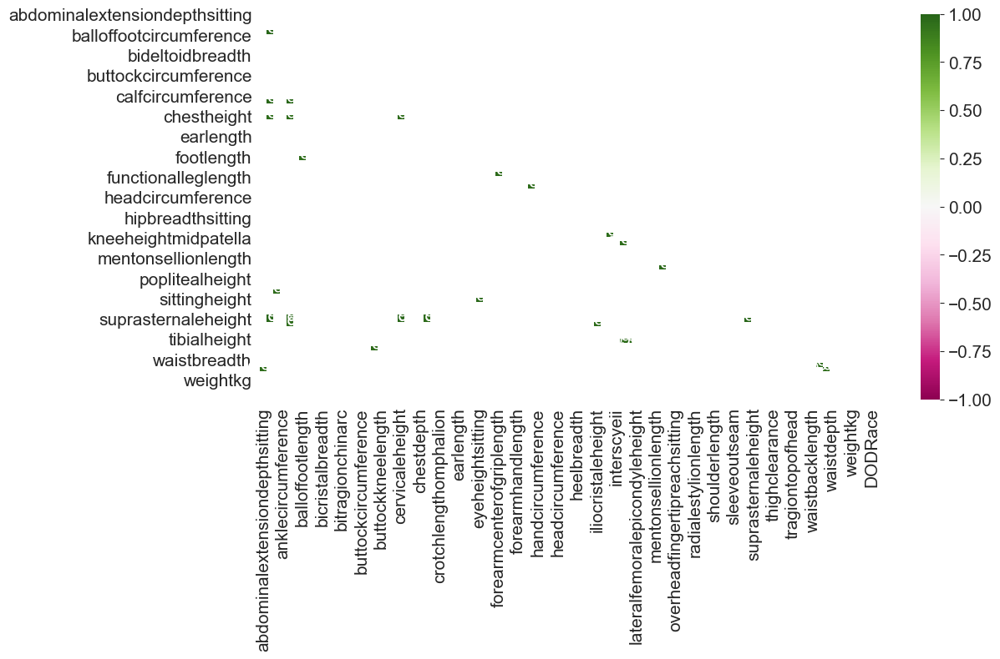

In [30]:
dfCorr = df.corr()
filteredDf = dfCorr[(abs(dfCorr) >=.95) & (abs(dfCorr)!=1)]

sns.heatmap(
    filteredDf, 
    mask=np.triu(np.ones_like(dfCorr, dtype=bool)), 
    annot=True, vmin=-1, vmax=1, cmap="PiYG"
)

In [31]:
df.corr().unstack().drop_duplicates().sort_values(key=abs, ascending=False).to_frame('Corr').head(5)

Corr
abdominalextensiondepthsitting abdominalextensiondepthsitting 1.0000
cervicaleheight                stature                        0.9912
                               suprasternaleheight            0.9893
stature                        suprasternaleheight            0.9892
acromialheight                 axillaheight                   0.9875

## Check Target Feature for Classification

In [32]:
df["DODRace"].value_counts().sort_index()

1    3792
2    1298
3     679
4     188
5      49
6      59
8       3
Name: DODRace, dtype: int64

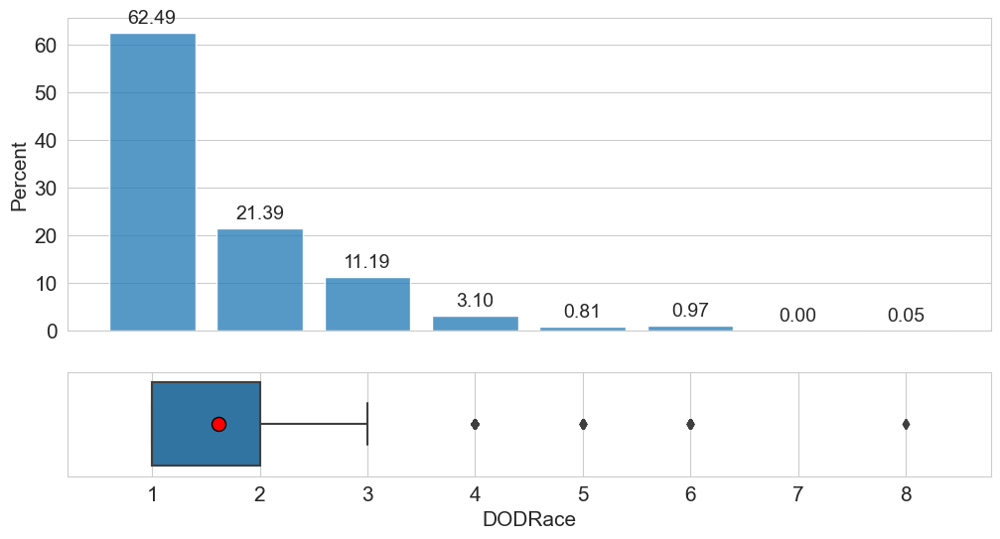

In [33]:
fig, (hist, box) = plt.subplots(nrows=2, sharex=True, gridspec_kw={'height_ratios': [3, 1]})
sns.histplot(df['DODRace'], discrete=True, stat='percent', shrink=.8, kde=False, ax=hist).grid(axis='y')
hist.bar_label(hist.containers[0], fmt='%.2f', padding=4, fontsize=14);
sns.boxplot(df['DODRace'], ax=box).grid(axis='x')

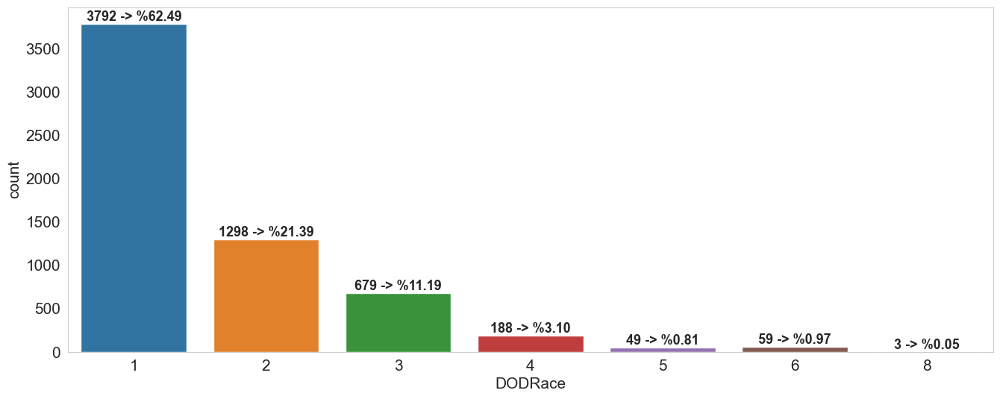

In [34]:
fig, ax = plt.subplots(figsize=(16,6))
# to show the proportion of each class
g = sns.countplot(df["DODRace"])
for c in g.containers:
    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h} -> %{100*(h/df["DODRace"].count()):0.2f}' if (h:=v.get_height()) > 0 else '' for v in c]
    g.bar_label(c, labels=labels, fontsize=13, weight='bold', rotation=0) 

In [35]:
df = df[df['DODRace'].isin([1,2,3])]
df['DODRace'].value_counts()

1    3792
2    1298
3     679
Name: DODRace, dtype: int64

<AxesSubplot:title={'center':'Percentage of Target'}>

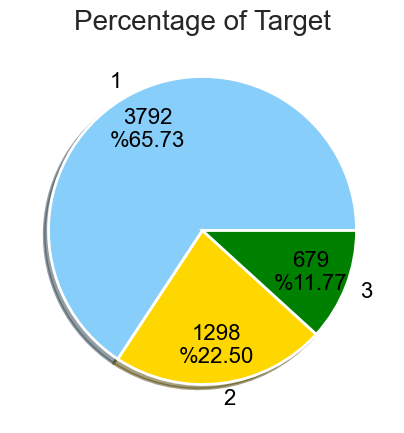

In [36]:
df['DODRace'].value_counts().sort_index().plot.pie(
#     subplots=True, layout=(1,2),
#     startangle=90, legend=True,
    shadow=True, figsize=(5,5),
    textprops={'fontsize':16, 'color':'k'},
    wedgeprops = {'linewidth':2, 'edgecolor':'w'},
    colors=['LightSkyBlue', 'gold', 'g', 'm'],
#     explode=[0, 0, 0, 0.1, 0.1, 0.1, 0.1],
    title='Percentage of Target',
#     labels=['Kecimen', 'Besni'],
    ylabel= "",
    labeldistance=1.1, pctdistance=0.75, 
    autopct=lambda x: '{:.0f}\n%{:.2f}'.format(len(df['DODRace'])*x/100, x), 
#     lambda x: '{:.0f}\n{:.2f}%'.format(len(df['species'])*x/100, x) 
#     "%.1f%%"
#     lambda x: f'{(x/100*len(df['species'])):.0f}\n{x:.2f}%'
)#.legend(loc='best', bbox_to_anchor=(1.0, 0.5)); # Not subplots

In [37]:
df.groupby('Gender')['DODRace'].value_counts().sort_index().to_frame().unstack(0)

DODRace      
Gender   Female  Male
DODRace              
1           975  2817
2           656   642
3           239   440

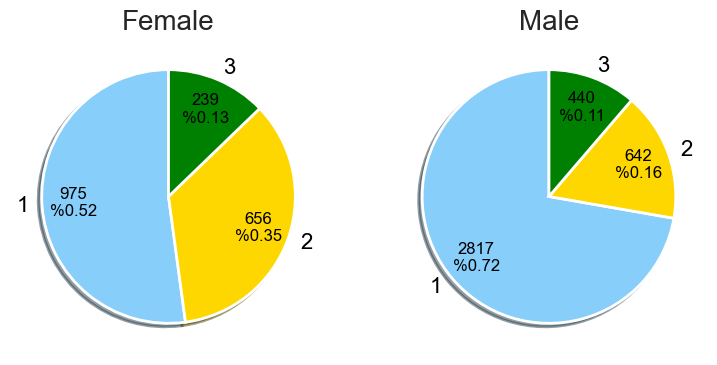

In [38]:
g = df.groupby('Gender')['DODRace'].value_counts(normalize=True).sort_index().to_frame().unstack(0).plot.pie(
    subplots=True, layout=(1,2), 
    startangle=90, legend=False,
    shadow=True, figsize=(9, 9),
    textprops={'fontsize':16, 'color':'k'},
    wedgeprops = {'linewidth':2, 'edgecolor':'w'},
    colors=['LightSkyBlue', 'gold', 'g'],
#     explode=[0, 0, 0, 0.1, 0.1, 0.1, 0.1],
    title=["Female","Male"],
    ylabel= "",
#     labels=['Kecimen', 'Besni'],
    labeldistance=1.1, pctdistance=0.75, 
    autopct=lambda x: '{:.0f}\n%{:.2f}'.format(len(df['DODRace'])*x/100, x), 
#     lambda x: '{:.0f}\n{:.2f}%'.format(len(df['species'])*x/100, x) 
#     "%.1f%%"
#     lambda x: f'{(x/100*len(df['species'])):.0f}\n{x:.2f}%'
)#.legend(loc='best', bbox_to_anchor=(1.0, 0.5)); # Not subplots

data = df.groupby('Gender')['DODRace'].value_counts().sort_index().to_frame().unstack(0)
data_per = df.groupby('Gender')['DODRace'].value_counts(normalize=True).sort_index().to_frame().unstack(0)
for x, ra in enumerate(g.ravel()):
    index = 1
    for y, te in enumerate(ra.texts):
        if y%2:
            te.set_text(f'{data.iloc[:, x][index].round(2)}\n%{data_per.iloc[:, x][index].round(2)}')
            te.set_fontsize(12)
            index+=1

## Outlier Detection

### Check Count Outliers

In [39]:
# We can produce a function to get the number of outliers respectively each class. For the sake of practicality, we find the outliers for features without consideration of class distinction
def detect_outliers(df, col_name, tukey=1.5):
    ''' 
    this function detects outliers based on 1.5 time IQR and
    returns the number of lower and uper limit and number of outliers respectively
    '''
    q1 = df[col_name].quantile(0.25)
    q3 = df[col_name].quantile(0.75)
    IQR = q3 - q1
                      
    upper_limit = q3 + (tukey*IQR)
    lower_limit = q1 - (tukey*IQR)
    outlier_count = ((df[col_name]<lower_limit) | (df[col_name]>upper_limit)).sum()
 
    return lower_limit, upper_limit, outlier_count

In [40]:
# Select Column Name iqr=3
def get_outliers_cols(df, columns, tukey=3):
    out_cols = []
    for col in columns:
        lower, upper, count = detect_outliers(df, col, tukey)
        print(f"{count:<3}: outlier -> {col:<30} lower:{lower:<10}, upper:{upper:<10}")
        out_cols.append(col) if count else _    
        
    return out_cols 

In [41]:
# objects = df.select_dtypes('O').columns
numbers = df.select_dtypes('number').columns

numbers.shape

(95,)

In [42]:
# Check Independent variable 3 times iqr multiplication 
out_cols = get_outliers_cols(df, numbers, tukey=3)

1  : outlier -> abdominalextensiondepthsitting lower:64.0      , upper:428.0     
0  : outlier -> acromialheight                 lower:1020.0    , upper:1797.0    
0  : outlier -> acromionradialelength          lower:230.0     , upper:426.0     
0  : outlier -> anklecircumference             lower:151.0     , upper:298.0     
0  : outlier -> axillaheight                   lower:955.0     , upper:1648.0    
0  : outlier -> balloffootcircumference        lower:164.0     , upper:325.0     
0  : outlier -> balloffootlength               lower:129.0     , upper:262.0     
0  : outlier -> biacromialbreadth              lower:242.0     , upper:557.0     
0  : outlier -> bicepscircumferenceflexed      lower:138.0     , upper:544.0     
0  : outlier -> bicristalbreadth               lower:184.0     , upper:366.0     
0  : outlier -> bideltoidbreadth               lower:284.0     , upper:697.0     
0  : outlier -> bimalleolarbreadth             lower:44.0      , upper:100.0     
0  : outlier -> 

In [43]:
out_cols

['abdominalextensiondepthsitting',
 'chestdepth',
 'hipbreadth',
 'hipbreadthsitting',
 'lowerthighcircumference',
 'thighclearance',
 'waistdepth']

In [44]:
df1 = df.copy()

In [45]:
# # We have decided to drop outliers over 1,5 iqr
# for col in out_cols:
#     df = df[(df[col]>detect_outliers(df, col, tukey=1.5)[0]) & (df[col]<detect_outliers(df, col, tukey=1.5)[1])]
# df.shape

In [46]:
len(df1) - len(df)

0

### Final Check Target Feature

In [47]:
df.groupby('Gender')['DODRace'].value_counts().sort_index().to_frame().unstack(0)

DODRace      
Gender   Female  Male
DODRace              
1           975  2817
2           656   642
3           239   440

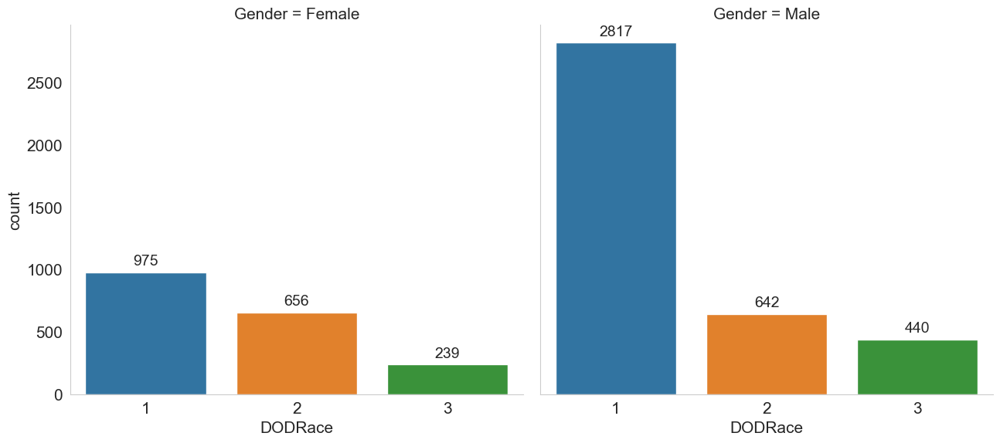

In [48]:
g = sns.catplot(
    x="DODRace", data=df,  hue=None,
    kind="count", col="Gender",   
    height=6, aspect=1.1,
);
for f in g.axes.flatten():
    for c in f.containers:
        f.bar_label(c, padding=4, fontsize=14);

In [49]:
df.info(max_cols=5)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5769 entries, 0 to 6067
Columns: 98 entries, abdominalextensiondepthsitting to WritingPreference
dtypes: int64(95), object(3)
memory usage: 4.4+ MB


In [50]:
df.reset_index(drop=True, inplace=True)

In [51]:
df.to_csv("ansurII_2.csv", index = False)

# Prediction (Multi-class Classification)

If you have done, use your data set resulting from Feature Engineering task. If you haven't done Feature Engineering, use the latest version of your data set.
In this section, you have two main tasks that apply to each algorithm:
1. Model Building and Prediction

 - SVM (Use ``LinearSVC`` model from``sklearn.svm`` module)
 - Decision Tree (Use ``DecisionTreeClassifier`` model from ``sklearn.tree`` module)
 - Random Forest (Use ``RandomForestClassifier`` model from ``sklearn.ensemble`` module) 
 - XGBoost (Use ``XGBClassifier`` model from``xgboost`` module)

2. Visualizing the Result

- Use [yellowbrick](https://www.scikit-yb.org/en/latest/), [seaborn](https://seaborn.pydata.org/tutorial/regression.html) or [matplotlib](https://matplotlib.org/) modules to visualize the model results.

- Show three plots for the results:
 - Class Prediction Error Bar Plot
 - Confusion Matrix
 - Classification Report

## Import Libraries

In [52]:
# conda install -c anaconda scikit-learn
# sklearn library for machine learning algorithms, data preprocessing, and evaluation
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline

# Supervised-Regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
# Supervised-Regression-metrics
# import sklearn sklearn.metrics.SCORERS.keys()
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Supervised-Classifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
# conda install -c conda-forge xgboost
from xgboost import XGBClassifier
# Supervised-Classifier-metrics
from sklearn.metrics import make_scorer, accuracy_score, recall_score, precision_score, f1_score, log_loss
from sklearn.metrics import classification_report, plot_confusion_matrix, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_curve, roc_auc_score, auc
from sklearn.metrics import plot_precision_recall_curve, precision_recall_curve, average_precision_score

# Supervised-cross_validate-GridSearchCV
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# UnSupervised
from sklearn.cluster import KMeans
# import sklearn sklearn.metrics.SCORERS.keys()
from pyclustertend import hopkins
from sklearn.metrics import silhouette_score
from sklearn.metrics.cluster import adjusted_rand_score

import pickle

In [53]:
# conda install -c districtdatalabs yellowbrick
# yellowbrick library for visualizing the model performance
from yellowbrick.features import RadViz
from yellowbrick.model_selection import CVScores
from yellowbrick.model_selection import FeatureImportances

# Supervised-Regression
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

# Supervised-Classifier
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve

# UnSupervised-Cluster
from yellowbrick.cluster import KElbowVisualizer 

# !pip install scikit-plot
from scikitplot.metrics import plot_roc, precision_recall_curve
from scikitplot.metrics import plot_precision_recall

## DATA Preprocessing
- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale. Why?

### Features and Target variable Split
* Splitting the dataset into X(independent variables) and y (dependent variable)

In [54]:
df = pd.read_csv("ansurII_2.csv")
df.shape

(5769, 98)

In [55]:
df.info(max_cols=5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5769 entries, 0 to 5768
Columns: 98 entries, abdominalextensiondepthsitting to WritingPreference
dtypes: int64(95), object(3)
memory usage: 4.3+ MB


In [56]:
X = df.drop(columns=['DODRace'])
y = df['DODRace']

### Train | Test Split
- Split the data into training and testing sets
- get_dummies for X_train and X_test - for data separated by ','
- OneHotEncoder for X_train and X_test

In [57]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=random_state)

In [58]:
X_train.shape, X_test.shape, X_train.shape[0]+X_test.shape[0]

((4615, 97), (1154, 97), 5769)

### `OneHotEncoder` and `LabelEncoder`for X_train and X_test

In [59]:
# way-1
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler

cat = X_train.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)

In [60]:
# way-2
from sklearn.preprocessing import OneHotEncoder

def trans_2_OneHotEncoder(X_train, X_test):
    
    cat = X_train.select_dtypes("object").columns.to_list()    
    enc = OneHotEncoder(handle_unknown="ignore", sparse=False)
    
    X_train_cat = pd.DataFrame(
        enc.fit_transform(X_train[cat]), index = X_train.index, 
        columns = enc.get_feature_names(cat)
    )    
    X_test_cat  = pd.DataFrame(
        enc.transform(X_test[cat]), index = X_test.index, 
        columns = enc.get_feature_names(cat)
    )    
    X_train = X_train_cat.join(X_train.select_dtypes("number"))
    X_test = X_test_cat.join(X_test.select_dtypes("number"))
        
    return X_train, X_test

X_train_enc, X_test_enc = trans_2_OneHotEncoder(X_train, X_test)

In [61]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

pd.DataFrame(y_test).value_counts().sort_index()

0    758
1    260
2    136
dtype: int64

# Parametric Based Modelling
- Fit the model with train dataset
- Get predict from vanilla model on both train and test sets to examine if there is over/underfitting   
- Apply GridseachCV for both hyperparemeter tuning and sanity test of our model.
- Use hyperparameters that you find from gridsearch and make final prediction and evaluate the result according to chosen metric.

In [1]:
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score, log_loss
from sklearn.metrics import plot_confusion_matrix, confusion_matrix

def eval_metric_classification(model, X_train, y_train, X_test, y_test, model_name='', average=None, labels=None):
    """ average (None, 'micro', 'macro', 'samples', 'weighted', 'binary')"""
    # The style parameters control properties like the color of the background and whether a grid is enabled by default.
    sns.set_style("whitegrid", {'axes.grid' : False})
    y_pred_test = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    
    print("TEST REPORT")
    print(classification_report(y_test, y_pred_test))
    fig, ax = plt.subplots(2, 1, figsize=(6, 6))
    plot_confusion_matrix(model, X_test, y_test, ax=ax[0]);
    print("\n"*3, "-*"*30)
    print("TRAIN REPORT")
    print(classification_report(y_train, y_pred_train))
    plot_confusion_matrix(model, X_train, y_train, ax=ax[1]);
    plt.tight_layout()
 return pd.DataFrame.from_dict({
        'accuracy_test' :accuracy_score(y_test, y_pred_test),
        'f1_test'       :np.array(f1_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],
        'recall_test'   :np.array(recall_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],
        'precision_test':np.array(precision_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],        
        'accuracy_train' :accuracy_score(y_train, y_pred_train),
        'f1_train'       :np.array(f1_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],        
        'recall_train'   :np.array(recall_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],
        'precision_train':np.array(precision_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],
    }, orient='index', columns=[model_name]).

In [ ]:
T

## 1. Implement Logistic Regression Model

### Vanilla Logistic Regression Model

---
---

# Compare The Models

So far, you have created a multi-classifier model with 4 different algorithms and made predictions. You can observe the performance of the models together with a barplot of your choice.

- Which algorithm did you achieve the highest prediction performance with? 
- What could be the factors that cause this? What are the principles of the most successful algorithm and its differences from other algorithms? 

In contrast;

- Which algorithm did you achieve the lowest prediction performance with? 
- What could be the factors that cause this? What are the principles of the most successful algorithm and its differences from other algorithms? 

The answers you will look for to these questions will increase your gains from Machine Learning course.

In [63]:
# compare = pd.concat([
#     out_score_log, out_score_knn, out_score_svc, out_score_bag_svc, 
#     out_score_dt, out_score_bag_dt, out_score_rfc, out_score_xgb,
# ])
# compare.to_json()

'{"accuracy_test":{"Bagging SVC":0.9072790295,"Logistic Regression":0.8795493934,"SVC":0.8726169844,"K-Nearest Neighbors":0.7729636049,"XGBoost":0.7885615251,"Bagging Decision Tree":0.4194107452,"Random Forest":0.3457538995,"Decision Tree":0.3266897747},"f1_test":{"Bagging SVC":0.6272727273,"Logistic Regression":0.6626506024,"SVC":0.6306306306,"K-Nearest Neighbors":0.4803149606,"XGBoost":0.4893617021,"Bagging Decision Tree":0.2769230769,"Random Forest":0.2602040816,"Decision Tree":0.2466039707},"recall_test":{"Bagging SVC":0.5073529412,"Logistic Regression":0.8088235294,"SVC":0.7720588235,"K-Nearest Neighbors":0.4485294118,"XGBoost":0.6764705882,"Bagging Decision Tree":0.7279411765,"Random Forest":0.75,"Decision Tree":0.8676470588},"precision_test":{"Bagging SVC":0.8214285714,"Logistic Regression":0.5612244898,"SVC":0.5329949239,"K-Nearest Neighbors":0.5169491525,"XGBoost":0.3833333333,"Bagging Decision Tree":0.170984456,"Random Forest":0.1574074074,"Decision Tree":0.143727162},"accuracy_train":{"Bagging SVC":0.9256771398,"Logistic Regression":0.8810400867,"SVC":0.8877573131,"K-Nearest Neighbors":1.0,"XGBoost":0.7984832069,"Bagging Decision Tree":0.4318526544,"Random Forest":0.3659804984,"Decision Tree":0.3111592633},"f1_train":{"Bagging SVC":0.72,"Logistic Regression":0.6676258993,"SVC":0.6834170854,"K-Nearest Neighbors":1.0,"XGBoost":0.5321944809,"Bagging Decision Tree":0.2796143251,"Random Forest":0.2627599244,"Decision Tree":0.2494273352},"recall_train":{"Bagging SVC":0.6298342541,"Logistic Regression":0.8545119705,"SVC":0.876611418,"K-Nearest Neighbors":1.0,"XGBoost":0.7458563536,"Bagging Decision Tree":0.7476979742,"Random Forest":0.7679558011,"Decision Tree":0.9023941068},"precision_train":{"Bagging SVC":0.8402948403,"Logistic Regression":0.5478158205,"SVC":0.56,"K-Nearest Neighbors":1.0,"XGBoost":0.4136874362,"Bagging Decision Tree":0.1719610335,"Random Forest":0.1584948689,"Decision Tree":0.1447135263}}'

In [64]:
compare = pd.read_json('{"accuracy_test":{"Bagging SVC":0.9072790295,"Logistic Regression":0.8795493934,"SVC":0.8726169844,"K-Nearest Neighbors":0.7729636049,"XGBoost":0.7885615251,"Bagging Decision Tree":0.4194107452,"Random Forest":0.3457538995,"Decision Tree":0.3266897747},"f1_test":{"Bagging SVC":0.6272727273,"Logistic Regression":0.6626506024,"SVC":0.6306306306,"K-Nearest Neighbors":0.4803149606,"XGBoost":0.4893617021,"Bagging Decision Tree":0.2769230769,"Random Forest":0.2602040816,"Decision Tree":0.2466039707},"recall_test":{"Bagging SVC":0.5073529412,"Logistic Regression":0.8088235294,"SVC":0.7720588235,"K-Nearest Neighbors":0.4485294118,"XGBoost":0.6764705882,"Bagging Decision Tree":0.7279411765,"Random Forest":0.75,"Decision Tree":0.8676470588},"precision_test":{"Bagging SVC":0.8214285714,"Logistic Regression":0.5612244898,"SVC":0.5329949239,"K-Nearest Neighbors":0.5169491525,"XGBoost":0.3833333333,"Bagging Decision Tree":0.170984456,"Random Forest":0.1574074074,"Decision Tree":0.143727162},"accuracy_train":{"Bagging SVC":0.9256771398,"Logistic Regression":0.8810400867,"SVC":0.8877573131,"K-Nearest Neighbors":1.0,"XGBoost":0.7984832069,"Bagging Decision Tree":0.4318526544,"Random Forest":0.3659804984,"Decision Tree":0.3111592633},"f1_train":{"Bagging SVC":0.72,"Logistic Regression":0.6676258993,"SVC":0.6834170854,"K-Nearest Neighbors":1.0,"XGBoost":0.5321944809,"Bagging Decision Tree":0.2796143251,"Random Forest":0.2627599244,"Decision Tree":0.2494273352},"recall_train":{"Bagging SVC":0.6298342541,"Logistic Regression":0.8545119705,"SVC":0.876611418,"K-Nearest Neighbors":1.0,"XGBoost":0.7458563536,"Bagging Decision Tree":0.7476979742,"Random Forest":0.7679558011,"Decision Tree":0.9023941068},"precision_train":{"Bagging SVC":0.8402948403,"Logistic Regression":0.5478158205,"SVC":0.56,"K-Nearest Neighbors":1.0,"XGBoost":0.4136874362,"Bagging Decision Tree":0.1719610335,"Random Forest":0.1584948689,"Decision Tree":0.1447135263}}')
compare

,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Bagging SVC,0.9073,0.6273,0.5074,0.8214,0.9257,0.7200,0.6298,0.8403
Logistic Regression,0.8795,0.6627,0.8088,0.5612,0.8810,0.6676,0.8545,0.5478
SVC,0.8726,0.6306,0.7721,0.5330,0.8878,0.6834,0.8766,0.5600
K-Nearest Neighbors,0.7730,0.4803,0.4485,0.5169,1.0000,1.0000,1.0000,1.0000
XGBoost,0.7886,0.4894,0.6765,0.3833,0.7985,0.5322,0.7459,0.4137
Bagging Decision Tree,0.4194,0.2769,0.7279,0.1710,0.4319,0.2796,0.7477,0.1720
Random Forest,0.3458,0.2602,0.7500,0.1574,0.3660,0.2628,0.7680,0.1585
Decision Tree,0.3267,0.2466,0.8676,0.1437,0.3112,0.2494,0.9024,0.1447


##  Accuracy Comparison

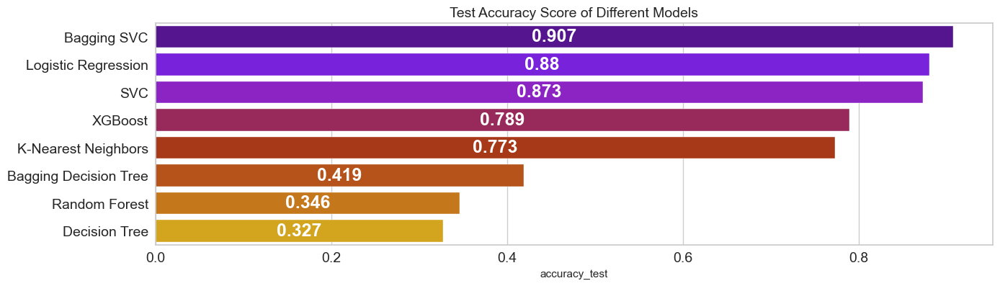

In [65]:
compare = compare.sort_values(by='accuracy_test', ascending=False)

plt.figure(figsize=(15,4))
ax = sns.barplot(x='accuracy_test', y=compare.index, data=compare.round(3), palette="gnuplot")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Accuracy Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

##  Recall Score Comparison

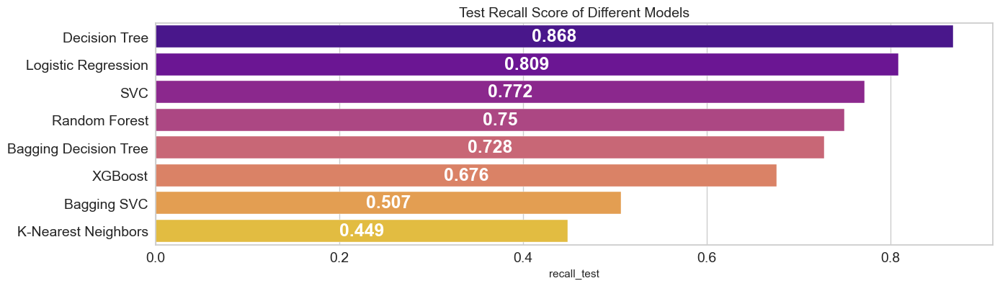

In [66]:
compare = compare.sort_values(by='recall_test', ascending=False)

plt.figure(figsize=(15,4))
ax = sns.barplot(x='recall_test', y=compare.index, data=compare.round(3), palette="plasma")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Recall Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

##  F1 Score Comparison

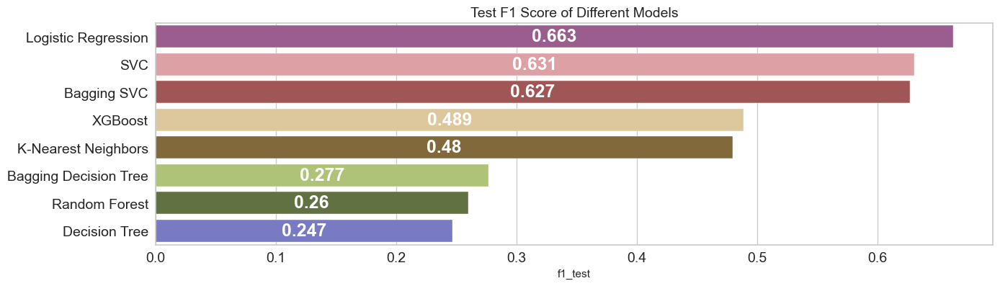

In [67]:
compare = compare.sort_values(by='f1_test', ascending=False)

plt.figure(figsize=(15,4))
ax = sns.barplot(x='f1_test', y=compare.index, data=compare.round(3), palette="tab20b_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test F1 Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

##  Precision Score Comparison

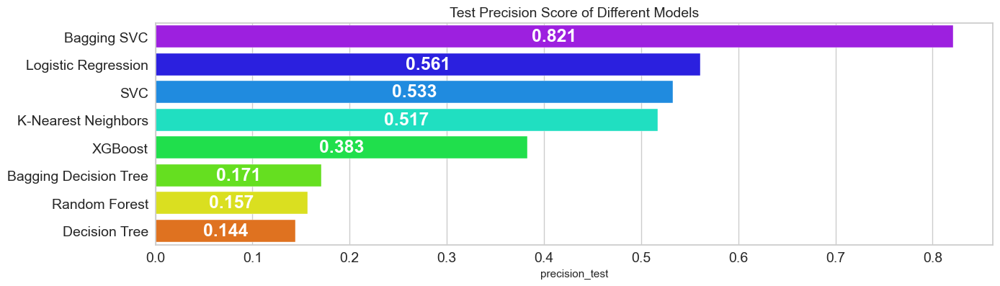

In [68]:
compare = compare.sort_values(by='precision_test', ascending=False)

plt.figure(figsize=(15,4))
ax = sns.barplot(x='precision_test', y=compare.index, data=compare.round(3), palette="gist_rainbow_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Precision Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

---
---

# SMOTE

- https://imbalanced-learn.org/stable/references/over_sampling.html


- https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

Verileri yeniden örnekleme, dengesiz bir veri kümesiyle başa çıkmak için en yaygın olarak tercih edilen yaklaşımlardan biridir. Bunun için genel olarak iki tür yöntem vardır i) Az Örnekleme ii) Aşırı Örnekleme. Çoğu durumda, yetersiz örnekleme teknikleri yerine aşırı örnekleme tercih edilir. Bunun nedeni, yetersiz örneklemede bazı önemli bilgileri taşıyabilecek örnekleri verilerden kaldırma eğiliminde olmamızdır. 

##  Ingest Data

In [69]:
df = pd.read_csv("ansurII_2.csv")

X = df.drop(columns=['DODRace'])
y = df['DODRace']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=random_state)

df.shape, X_train.shape, X_test.shape

((5769, 98), (4615, 97), (1154, 97))

In [70]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler

cat = X_train.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)

In [71]:
from sklearn.preprocessing import LabelEncoder

label_enc = LabelEncoder()
y_train   = label_enc.fit_transform(y_train)
y_test    = label_enc.transform(y_test)

pd.DataFrame(y_test).value_counts().sort_index()

0    758
1    260
2    136
dtype: int64

##  Smote implement (Synthetic Minority Oversampling Technique)

In [72]:
# conda install -c conda-forge imbalanced-learn
import imblearn 
print(imblearn.__version__)
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

0.9.1


### SMOTE

- https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html#imblearn.over_sampling.SMOTE

In [73]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

smote = SMOTE(random_state=random_state) 

# pipeline for SMOTE
pipe_smote = Pipeline([
    ("OneHotEncoder",column_trans),
    ("smote", smote),
])
X_over, y_over = pipe_smote.fit_resample(X_train, y_train)

In [74]:
print('Unique Class:{}, value_counts:{}'.format(*np.unique(y_train, return_counts=True)))
print('Unique Class:{}, value_counts:{}'.format(*np.unique(y_over, return_counts=True)))

Unique Class:[0 1 2], value_counts:[3034 1038  543]
Unique Class:[0 1 2], value_counts:[3034 3034 3034]


In [75]:
pd.DataFrame(y_over).value_counts()

0    3034
1    3034
2    3034
dtype: int64

### RandomUnderSampler

In [76]:
from imblearn.under_sampling import RandomUnderSampler
under = RandomUnderSampler(random_state=random_state) 

# pipeline for RandomUnderSampler
pipe_under = Pipeline([
    ("OneHotEncoder",column_trans),
    ("under", under),
])
X_under, y_under = pipe_under.fit_resample(X_train, y_train)

In [77]:
print('Unique Class:{}, value_counts:{}'.format(*np.unique(y_train, return_counts=True)))
print('Unique Class:{}, value_counts:{}'.format(*np.unique(y_under, return_counts=True)))

Unique Class:[0 1 2], value_counts:[3034 1038  543]
Unique Class:[0 1 2], value_counts:[543 543 543]


In [78]:
pd.DataFrame(y_under).value_counts()

0    543
1    543
2    543
dtype: int64

### HybridSampler

In [79]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

under = RandomUnderSampler(sampling_strategy={0: 2500}, random_state=random_state)
smote = SMOTE(sampling_strategy={2: 1000}, random_state=random_state)  

# pipeline for HybridSampler
# create a pipeline that will automatically apply over and under
# sampling in order to steps that we created.
pipe_resampled = Pipeline([
    ("OneHotEncoder",column_trans),
    ("smote", smote),
    ("under", under),
])
X_resampled, y_resampled = pipe_resampled.fit_resample(X_train, y_train)

In [80]:
print('Unique Class:{}, value_counts:{}'.format(*np.unique(y_train, return_counts=True)))
print('Unique Class:{}, value_counts:{}'.format(*np.unique(y_resampled, return_counts=True)))

Unique Class:[0 1 2], value_counts:[3034 1038  543]
Unique Class:[0 1 2], value_counts:[2500 1038 1000]


In [81]:
pd.DataFrame(y_resampled).value_counts()

0    2500
1    1038
2    1000
dtype: int64

## Logistic Regression Over/Under Sampling

What does the smote pipeline do?

smote_pipeline.fit(X_train, y_train) 

  01. column_trans.fit_transform(X_train) #(Onehooencoder and minmaxscaler)
  02. over.fit_resample(X_train_transform) 
  03. under.fit_resample(X_train_transform_over)
  04. log_model.fit(X_train_transform_over_under, y_train)

smote_pipeline.predict(X_test)

**Note:** for predict, over and under sumpling algortims do nothing for X_test.

  01. column_trans.transform(X_test) #(Onehooencoder and minmaxscaler) 
  02. log_model.predict(X_test_transform)

In [82]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.compose import make_column_transformer
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression
from imblearn.pipeline import Pipeline

cat = X_train.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)
under     = RandomUnderSampler(sampling_strategy={0: 2500}, random_state=random_state) 
smote     = SMOTE(sampling_strategy={2: 1000}, random_state=random_state) 
log_model = LogisticRegression(random_state=random_state)

# pipeline for HybridSampler
# create a pipeline that will automatically apply over and under
# sampling in order to steps that we created.
pipe_log_smote = Pipeline([
    ("OneHotEncoder",column_trans),
    ("smote", smote),
    ("under", under),
    ("log", log_model),
])
pipe_log_smote.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Gender',
                                                   'SubjectsBirthLocation',
                                                   'WritingPreference'])])),
                ('smote', SMOTE(random_state=42, sampling_strategy={2: 1000})),
                ('under',
                 RandomUnderSampler(random_state=42,
                                    sampling_strategy={0: 2500})),
                ('log', LogisticRegression(random_state=42))])

TEST REPORT
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       758
           1       0.95      0.91      0.93       260
           2       0.68      0.67      0.68       136

    accuracy                           0.90      1154
   macro avg       0.85      0.84      0.85      1154
weighted avg       0.90      0.90      0.90      1154




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3034
           1       0.95      0.92      0.93      1038
           2       0.69      0.70      0.70       543

    accuracy                           0.91      4615
   macro avg       0.86      0.85      0.86      4615
weighted avg       0.91      0.91      0.91      4615



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Smote Logistic,0.9038,0.6766,0.6691,0.6842,0.9096,0.6978,0.7017,0.6940


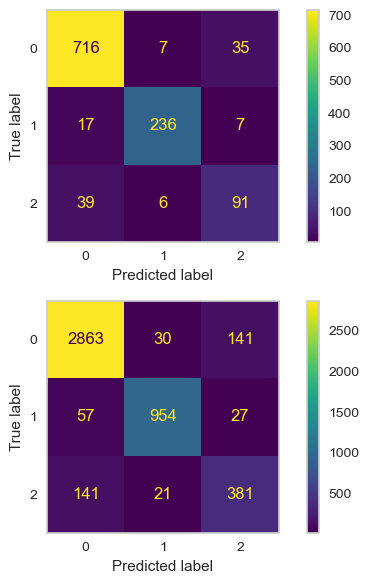

In [83]:
eval_metric_classification(
    pipe_log_smote, X_train, y_train, X_test, y_test, 
    'Smote Logistic', average=None, labels=[2]
)

In [84]:
from sklearn.model_selection import cross_validate, cross_val_score

smote = SMOTE(sampling_strategy={2:2400}, random_state=random_state) 
under = RandomUnderSampler(sampling_strategy={0:2400}, random_state=random_state) 
log_model = LogisticRegression(random_state=random_state)

# pipeline for Cross Validate
model = Pipeline([
    ("OneHotEncoder",column_trans),
    ("smote", smote),
    ("under", under),
    ("log", log_model),
])
scoring = {
    "f1_2" : make_scorer(f1_score, average = None, labels=[2]),
    "recall_2" : make_scorer(recall_score, average = None, labels=[2]),
    "precision_2" : make_scorer(precision_score, average = None, labels=[2]),
}
scores = cross_validate(
    model, X_train, y_train, 
    scoring = scoring, # ['accuracy', 'f1_macro', 'precision_macro','recall_macro'], 
    return_train_score=True,
    error_score="raise",
    n_jobs=-1,
    cv=5,
)
df_scores = pd.DataFrame.from_dict(scores, orient='columns')
df_scores.mean()[2:]

test_f1_2           0.6093
train_f1_2          0.6555
test_recall_2       0.7736
train_recall_2      0.8352
test_precision_2    0.5034
train_precision_2   0.5395
dtype: float64

In [85]:
compare

,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Bagging SVC,0.9073,0.6273,0.5074,0.8214,0.9257,0.7200,0.6298,0.8403
Logistic Regression,0.8795,0.6627,0.8088,0.5612,0.8810,0.6676,0.8545,0.5478
SVC,0.8726,0.6306,0.7721,0.5330,0.8878,0.6834,0.8766,0.5600
K-Nearest Neighbors,0.7730,0.4803,0.4485,0.5169,1.0000,1.0000,1.0000,1.0000
XGBoost,0.7886,0.4894,0.6765,0.3833,0.7985,0.5322,0.7459,0.4137
Bagging Decision Tree,0.4194,0.2769,0.7279,0.1710,0.4319,0.2796,0.7477,0.1720
Random Forest,0.3458,0.2602,0.7500,0.1574,0.3660,0.2628,0.7680,0.1585
Decision Tree,0.3267,0.2466,0.8676,0.1437,0.3112,0.2494,0.9024,0.1447


## SVC Over/Under Sampling

## Xgboost Over/ Under Sampling

- Evaluation metrics 
https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd

In [86]:
# from sklearn.metrics import matthews_corrcoef

# matthews_corrcoef(y_test, y_pred)

In [87]:
# from sklearn.metrics import cohen_kappa_score

# cohen_kappa_score(y_test, y_pred)

#  SHAP

- https://github.com/slundberg/shap#citations
- https://towardsdatascience.com/shap-explain-any-machine-learning-model-in-python-24207127cad7
- https://analyticsindiamag.com/a-complete-guide-to-shap-shapley-additive-explanations-for-practitioners/#:~:text=Meet%20Festive%20Rush-,SHAP%20or%20SHAPley%20Additive%20exPlanations%20is%20a%20visualization%20tool%20that,each%20feature%20to%20the%20prediction.


- pip install shap
- conda install -c conda-forge shap

## Before Check Model

In [88]:
compare

,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Bagging SVC,0.9073,0.6273,0.5074,0.8214,0.9257,0.7200,0.6298,0.8403
Logistic Regression,0.8795,0.6627,0.8088,0.5612,0.8810,0.6676,0.8545,0.5478
SVC,0.8726,0.6306,0.7721,0.5330,0.8878,0.6834,0.8766,0.5600
K-Nearest Neighbors,0.7730,0.4803,0.4485,0.5169,1.0000,1.0000,1.0000,1.0000
XGBoost,0.7886,0.4894,0.6765,0.3833,0.7985,0.5322,0.7459,0.4137
Bagging Decision Tree,0.4194,0.2769,0.7279,0.1710,0.4319,0.2796,0.7477,0.1720
Random Forest,0.3458,0.2602,0.7500,0.1574,0.3660,0.2628,0.7680,0.1585
Decision Tree,0.3267,0.2466,0.8676,0.1437,0.3112,0.2494,0.9024,0.1447


## Shap values for all data

{'log__C': 4.5,
 'log__class_weight': 'balanced',
 'log__penalty': 'l1',
 'log__solver': 'saga'}

In [89]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

cat = X_train.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)
X_train_trans = column_trans.fit_transform(X_train)
X_test_trans = column_trans.transform(X_test)

features = column_trans.get_feature_names_out() # X_train.columns
features

log_model = LogisticRegression(
    penalty='l1',  solver='saga', 
    C=4.5, class_weight='balanced',
    random_state=random_state
)
log_model.fit(X_train_trans, y_train)

LogisticRegression(C=4.5, class_weight='balanced', penalty='l1',
                   random_state=42, solver='saga')

In [90]:
# print(list(column_trans.get_feature_names_out()))

In [91]:
column_trans.get_feature_names_out().shape

(222,)

In [92]:
X_train.shape, X_train_trans.shape

((4615, 97), (4615, 222))

In [93]:
# conda install -c conda-forge shap
import shap

#LinearExplainer
explainer = shap.LinearExplainer(log_model, X_train_trans) 
shap_values = explainer.shap_values(X_test_trans)
shap_values

[array([[-1.28328015e-05,  4.59729952e-01,  3.29013697e-01, ...,
          2.78028591e-01,  1.64786014e-01,  2.66419652e-02],
        [-1.28328015e-05,  4.59729952e-01, -6.71456525e-03, ...,
          2.30623887e-01,  2.64385731e-01, -4.29053335e-02],
        [-1.28328015e-05,  4.59729952e-01, -6.71456525e-03, ...,
          1.12112126e-01,  2.05999690e-01,  5.24279636e-03],
        ...,
        [ 2.28138694e-05, -8.17297692e-01, -6.71456525e-03, ...,
         -5.51553736e-01, -1.92399177e-01, -1.34814764e-02],
        [ 2.28138694e-05, -8.17297692e-01, -6.71456525e-03, ...,
         -3.38232566e-01, -1.40882082e-01,  1.86172769e-02],
        [ 2.28138694e-05, -8.17297692e-01, -6.71456525e-03, ...,
         -2.19720805e-01,  9.95310272e-02,  5.24279636e-03]]),
 array([[-0.04399973, -0.79073407,  1.56681856, ..., -0.14390764,
         -0.25817691, -0.51668491],
        [-0.04399973, -0.79073407, -0.03197589, ..., -0.11937096,
         -0.41422382,  0.83209095],
        [-0.04399973, -0.

In [94]:
np.array(shap_values).shape

(3, 1154, 222)

In [95]:
pd.DataFrame.from_records(shap_values)

0     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, 1.5...   
2  [6.396079135920733e-05, 0.09638654008794362, -...   

                                                1     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                2     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                3     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                4     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                5     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                6     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                7     \
0  [2.281386937776343e-05, -0.8172976924003974, -...   
1  [0.07822173370082496, 1.4057494571050986, -0.0...   
2  [-0.00011370807352747972, -0.1713538490452331,...   

                                                8     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                9     \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                10    \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                11    \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                12    \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                13    \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                14    \
0  [-1.2832801524991928e-05, 0.45972995197522354,...   
1  [-0.04399972520671404, -0.790734069621618, -0....   
2  [6.396079135920733e-05, 0.09638654008794362, 0...   

                                                15    \
0  [2.281386937776343e-05, -0.8172976924003974, -...   
1  [0.07822173370082496, 1.4057494571050986, -0.0...   
2  [-0.00011370807352747972, -0.1713538490452331,...   

                                                16    \
0  [2.281386937776343e-05, -0.8172976924003974, 0...   
1  [0.07822173370082496, 1.4057494571050986, 1.56...   
2  [-0.00011370807352747972, -0.1713538490452331,...   

                                                17    \
0  [2.281386937776343e-05, -0.8172976924003974, -...   
1  [0.07822173370082496, 1.4057494571050986, -0.0...   
2  [-0.00011370807352747972, -0.1713538490452331,...   

In [96]:
pd.DataFrame.from_records(shap_values).T

,0,1,2
0,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, 1.5...","[6.396079135920733e-05, 0.09638654008794362, -..."
1,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, -0....","[6.396079135920733e-05, 0.09638654008794362, 0..."
2,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, -0....","[6.396079135920733e-05, 0.09638654008794362, 0..."
3,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, -0....","[6.396079135920733e-05, 0.09638654008794362, 0..."
4,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, -0....","[6.396079135920733e-05, 0.09638654008794362, 0..."
...,...,...,...
1149,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, -0....","[6.396079135920733e-05, 0.09638654008794362, 0..."
1150,"[-1.2832801524991928e-05, 0.45972995197522354,...","[-0.04399972520671404, -0.790734069621618, -0....","[6.396079135920733e-05, 0.09638654008794362, 0..."
1151,"[2.281386937776343e-05, -0.8172976924003974, -...","[0.07822173370082496, 1.4057494571050986, -0.0...","[-0.00011370807352747972, -0.1713538490452331,..."
1152,"[2.281386937776343e-05, -0.8172976924003974, -...","[0.07822173370082496, 1.4057494571050986, -0.0...","[-0.00011370807352747972, -0.1713538490452331,..."


In [97]:
# check Hispanic class index 2 
shap_values[2].shape

(1154, 222)

## Shap values visualize all Features and all Class

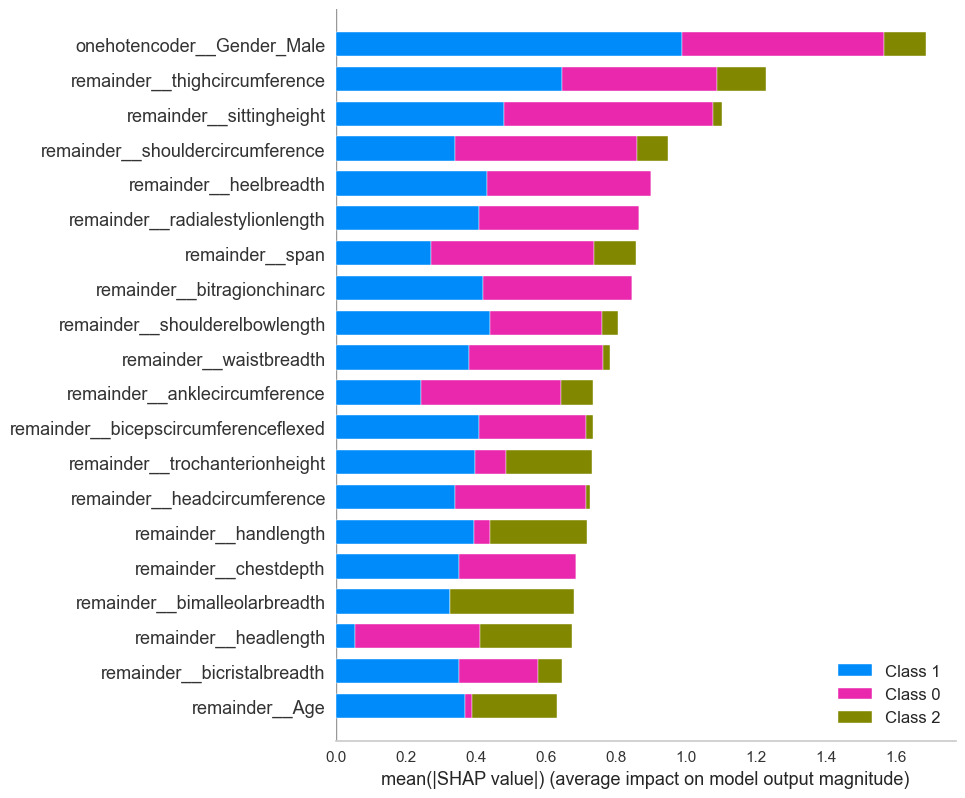

In [98]:
shap.summary_plot(
    shap_values, X_test_trans, 
    feature_names = features,
    max_display=20,
)

In [99]:
# plot the SHAP values for the Spesfic Class output of all instances
shap.initjs()
class_idx = 2 
shap.force_plot(explainer.expected_value[class_idx], shap_values[class_idx], X_test, link="logit")

## Shap values visualize all Features and specific Class

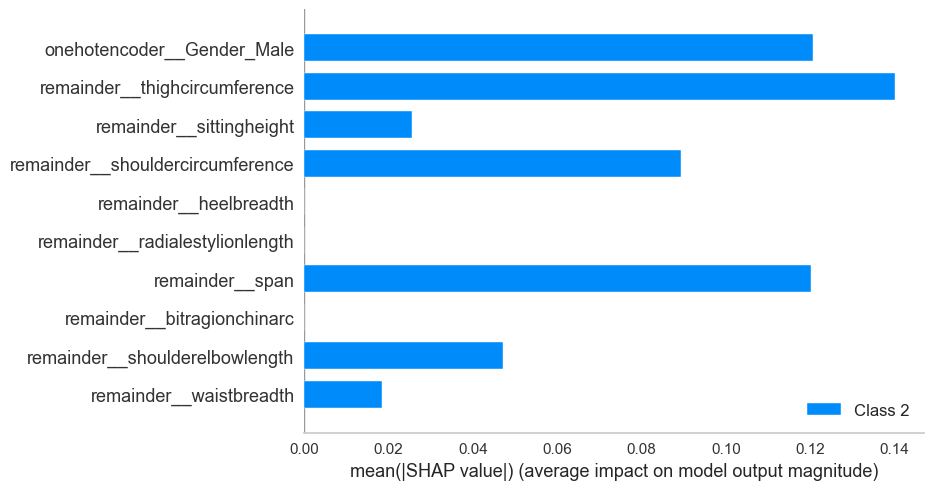

In [100]:
# visualize class index 2 
shap.summary_plot(
    shap_values, 
    X_test_trans,
    feature_names=features,
    plot_type="bar",
    class_inds=[2],
    max_display=10,
)

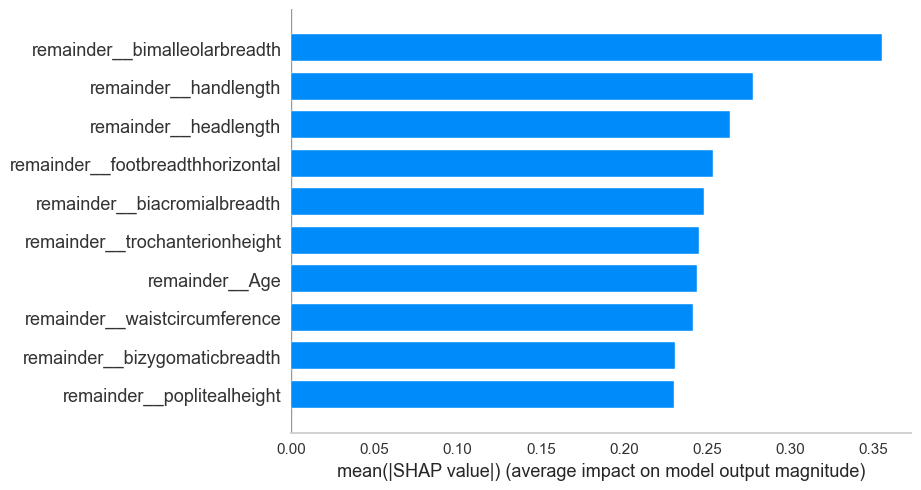

In [101]:
# visualize class index 2 
shap.summary_plot(
    shap_values[2], 
    X_test_trans,
    feature_names=features,
    plot_type="bar",
    max_display=10,
)

## Shap values Feature Importance

In [102]:
features.shape

(222,)

In [103]:
# features = column_trans.get_feature_names_out(X_train.columns)
vals= np.abs(shap_values).mean(axis=0)
feature_importance = pd.DataFrame(list(zip(features, sum(vals))), columns=['col_name','feature_importance_vals'])
feature_importance

,col_name,feature_importance_vals
0,onehotencoder__Gender_Female,21.2286
1,onehotencoder__Gender_Male,648.6831
2,onehotencoder__SubjectsBirthLocation_Alabama,82.5161
3,onehotencoder__SubjectsBirthLocation_Alaska,1.2258
4,onehotencoder__SubjectsBirthLocation_Antigua a...,0.0000
...,...,...
217,remainder__waistheightomphalion,114.3008
218,remainder__weightkg,89.5945
219,remainder__wristcircumference,170.7861
220,remainder__wristheight,143.1593


In [104]:
# select non-zeros and rename column Name
feature_importance = feature_importance[feature_importance['feature_importance_vals']>0] # filter zero
feature_importance = feature_importance.replace(['remainder__'], '', regex=True)
feature_importance['col_name'] = feature_importance['col_name'].str.split('_').str[2].fillna(feature_importance['col_name'])
feature_importance

,col_name,feature_importance_vals
0,Gender,21.2286
1,Gender,648.6831
2,SubjectsBirthLocation,82.5161
3,SubjectsBirthLocation,1.2258
6,SubjectsBirthLocation,10.0965
...,...,...
217,waistheightomphalion,114.3008
218,weightkg,89.5945
219,wristcircumference,170.7861
220,wristheight,143.1593


In [105]:
feature_importance = feature_importance.groupby('col_name').sum()
feature_importance.sort_values(by=['feature_importance_vals'], key=abs, ascending=False, inplace=True)
feature_importance.head(20)
# feature_importance.head(20).index

,feature_importance_vals
col_name,
SubjectsBirthLocation,1668.1972
Gender,669.9117
thighcircumference,473.0860
sittingheight,424.1781
shouldercircumference,365.4966
heelbreadth,346.2018
radialestylionlength,332.8046
span,329.6642
bitragionchinarc,325.8525


In [106]:
# select most important features percent:20
top_N_percent = feature_importance.quantile(0.80).values[0]
top_N_percent

247.70647015838935

In [107]:
feature_importance_list = feature_importance[feature_importance['feature_importance_vals']> top_N_percent].index.to_list()
print(f'top_N_percent upper: {top_N_percent.round(0):>16}, size: {len(feature_importance_list)}\n')
print(feature_importance_list)

top_N_percent upper:            248.0, size: 20

['SubjectsBirthLocation', 'Gender', 'thighcircumference', 'sittingheight', 'shouldercircumference', 'heelbreadth', 'radialestylionlength', 'span', 'bitragionchinarc', 'shoulderelbowlength', 'waistbreadth', 'anklecircumference', 'bicepscircumferenceflexed', 'trochanterionheight', 'headcircumference', 'handlength', 'chestdepth', 'bimalleolarbreadth', 'headlength', 'bicristalbreadth']


In [108]:
hispanic = [
    "SubjectsBirthLocation",  'handlength',  'forearmcircumferenceflexed', "headlength", 'bitragionsubmandibulararc',
    'footbreadthhorizontal',  'bimalleolarbreadth', 'poplitealheight', 'waistdepth', 'WritingPreference', 'tragiontopofhead',
    'bideltoidbreadth', 'neckcircumferencebase', 'biacromialbreadth','buttockheight', 'buttockkneelength', 'earlength', 
    'axillaheight', "Age"
]

## Shap values check local data

In [109]:
display(
    X_test.head(1),
    pd.DataFrame(y_test).head(1))

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,SubjectsBirthLocation,Age,WritingPreference
4013,266,1463,346,245,1344,251,208,421,337,300,491,77,326,316,144,1035,212,916,639,525,387,1548,290,1034,239,1326,883,588,346,36,63,24,236,820,106,264,346,316,542,479,1218,88,210,194,161,596,206,353,75,362,393,1070,655,430,465,501,573,502,81,427,123,391,444,1478,114,439,266,1170,381,156,941,914,597,1859,1790,1464,1130,644,175,858,482,139,932,1579,477,329,953,240,393,1080,867,180,874,Male,Alabama,19,Right hand


,0
0,0


In [110]:
pd.DataFrame(X_test_trans).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221
0,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.4458,0.5903,0.6736,0.6742,0.5743,0.5417,0.6064,0.6866,0.4416,0.6242,0.4786,0.6111,0.5315,0.5221,0.5600,0.5165,0.2384,0.6132,0.6375,0.6444,0.4708,0.6415,0.5133,0.4993,0.3770,0.6443,0.6485,0.3528,0.4578,0.5238,0.4857,0.5238,0.4975,0.6532,0.5918,0.5000,0.5570,0.5743,0.4499,0.5905,0.7963,0.5526,0.5682,0.5176,0.6444,0.7068,0.6607,0.6552,0.6000,0.4757,0.4330,0.5812,0.5686,0.5479,0.5867,0.5827,0.6409,0.6198,0.7917,0.5480,0.4677,0.4854,0.5684,0.6796,0.4583,0.6091,0.6101,0.5668,0.7237,0.6234,0.6679,0.6830,0.6254,0.6802,0.6316,0.6280,0.5940,0.5066,0.4576,0.6465,0.5696,0.7727,0.6326,0.3652,0.5523,0.4720,0.4578,0.4051,0.5073,0.6224,0.4696,0.6087,0.5794,0.0488
1,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.7229,0.6872,0.5764,0.5758,0.6578,0.6750,0.6383,0.8458,0.5730,0.5576,0.7571,0.5556,0.6396,0.6544,0.7200,0.6620,0.6570,0.5542,0.5697,0.4844,0.6459,0.7264,0.7467,0.8321,0.6995,0.6462,0.5416,0.6840,0.7600,0.5238,0.4000,0.5714,0.7868,0.9153,0.5306,0.6481,0.5949,0.6634,0.7615,0.6078,0.6279,0.6053,0.6364,0.5412,0.5111,0.7293,0.7321,0.7034,0.6000,0.5291,0.5172,0.6270,0.7255,0.8664,0.8266,0.5977,0.6564,0.6240,0.8750,0.6280,0.4355,0.7322,0.7735,0.6981,0.4375,0.5909,0.6792,0.8289,0.6645,0.7403,0.9216,0.7961,0.6421,0.7069,0.7459,0.7340,0.6845,0.5808,0.6186,0.6919,0.5823,0.6591,0.5674,0.9045,0.8870,0.6840,0.7189,0.7004,0.8098,0.5606,0.7094,0.5870,0.6698,0.6829
2,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.

In [111]:
pd.DataFrame(X_test_trans[:1])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221
0,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.4458,0.5903,0.6736,0.6742,0.5743,0.5417,0.6064,0.6866,0.4416,0.6242,0.4786,0.6111,0.5315,0.5221,0.5600,0.5165,0.2384,0.6132,0.6375,0.6444,0.4708,0.6415,0.5133,0.4993,0.3770,0.6443,0.6485,0.3528,0.4578,0.5238,0.4857,0.5238,0.4975,0.6532,0.5918,0.5000,0.5570,0.5743,0.4499,0.5905,0.7963,0.5526,0.5682,0.5176,0.6444,0.7068,0.6607,0.6552,0.6000,0.4757,0.4330,0.5812,0.5686,0.5479,0.5867,0.5827,0.6409,0.6198,0.7917,0.5480,0.4677,0.4854,0.5684,0.6796,0.4583,0.6091,0.6101,0.5668,0.7237,0.6234,0.6679,0.6830,0.6254,0.6802,0.6316,0.6280,0.5940,0.5066,0.4576,0.6465,0.5696,0.7727,0.6326,0.3652,0.5523,0.4720,0.4578,0.4051,0.5073,0.6224,0.4696,0.6087,0.5794,0.0488


In [112]:
# y_test and predict
y_test[:1], log_model.predict(X_test_trans[:1])

(array([0], dtype=int64), array([0], dtype=int64))

Model predicted class: [0]
Model predicted shape: (1, 222)


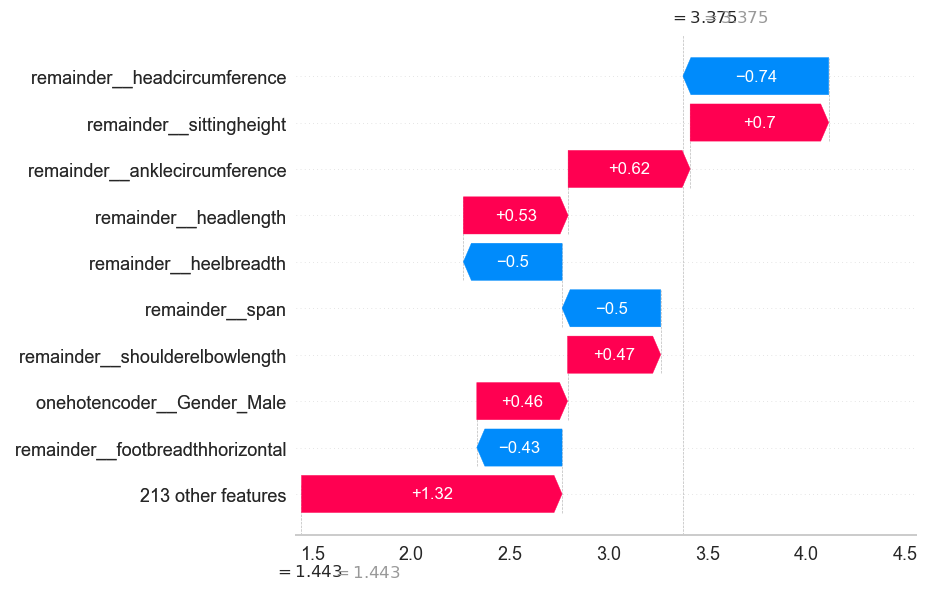

None

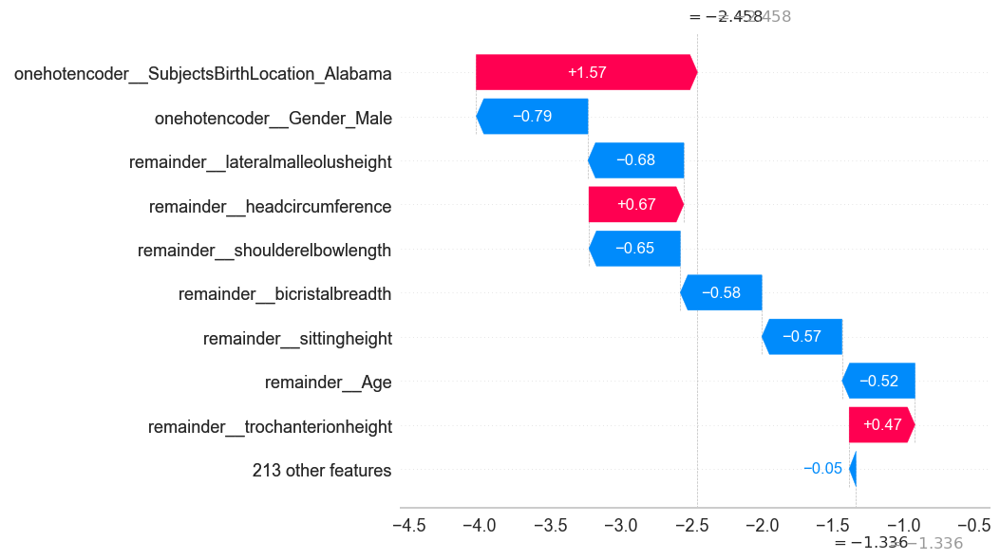

None

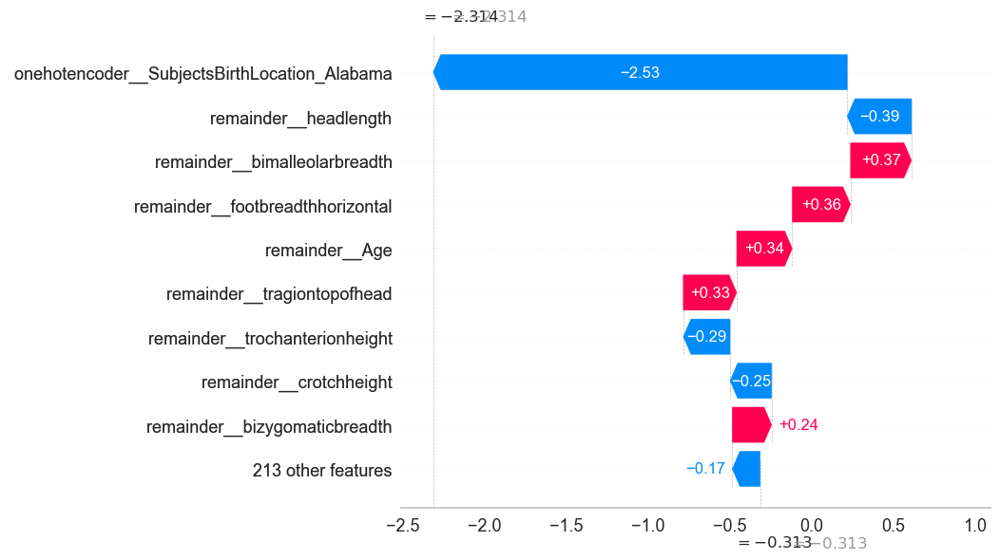

None

In [113]:
shap.initjs()

# visualize the first prediction's explanation
# Expected result (up to a rounding error)
shap_values_loc = explainer.shap_values(X_test_trans[:1])
prediction = log_model.predict(X_test_trans[:1])

print(f"Model predicted class: {prediction}")
print(f"Model predicted shape: {shap_values_loc[0].shape}")

for clas in range(0,3):    
    # Force plot
    display(
        shap.force_plot(
            explainer.expected_value[clas],
            shap_values_loc[clas],
            X_test_trans[:1], # for values
            feature_names= features,
        )
    )
    display(
        shap.plots._waterfall.waterfall_legacy(
            explainer.expected_value[clas], 
            shap_values_loc[clas].reshape(-1),
            X_test_trans[1],
            feature_names= features,
            max_display=10
        )
    )

## Shap values Future Importance Define New Model

In [114]:
X_shap = X[feature_importance_list]
print(X_shap.shape)

X_train_shap, X_test_shap, y_train_shap, y_test_shap = train_test_split(
    X_shap, y, test_size=0.2, stratify=y, random_state=random_state
)

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train_shap = le.fit_transform(y_train_shap)
y_test_shap = le.transform(y_test_shap)

(5769, 20)


In [115]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

cat = X_train_shap.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)
log_model = LogisticRegression(
    penalty='l1',  solver='saga', 
    C=4.5, class_weight='balanced',
    random_state=random_state
)
# pipeline for Logistic Regression
pipe_log_shap = Pipeline([
    ("OneHotEncoder",column_trans),
    ("log", log_model)
])
pipe_log_shap.fit(X_train_shap, y_train_shap)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['SubjectsBirthLocation',
                                                   'Gender'])])),
                ('log',
                 LogisticRegression(C=4.5, class_weight='balanced',
                                    penalty='l1', random_state=42,
                                    solver='saga'))])

TEST REPORT
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       758
           1       0.84      0.90      0.87       260
           2       0.52      0.80      0.63       136

    accuracy                           0.84      1154
   macro avg       0.77      0.84      0.79      1154
weighted avg       0.87      0.84      0.85      1154




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.96      0.83      0.89      3034
           1       0.89      0.92      0.90      1038
           2       0.49      0.80      0.61       543

    accuracy                           0.85      4615
   macro avg       0.78      0.85      0.80      4615
weighted avg       0.89      0.85      0.86      4615



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
SHAP Logistic Regression,0.8423,0.6301,0.8015,0.5190,0.8490,0.6061,0.8048,0.4861


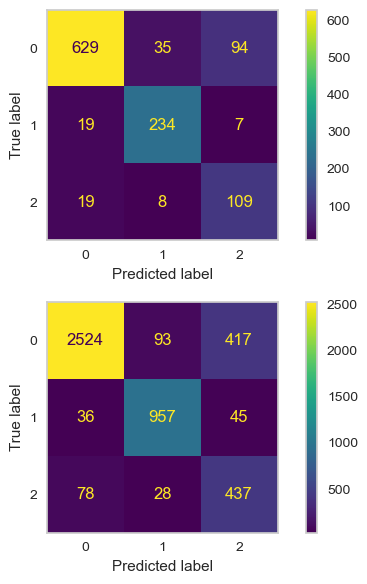

In [116]:
eval_metric_classification(
    pipe_log_shap, X_train_shap, y_train_shap, X_test_shap, y_test_shap, 
    'SHAP Logistic Regression', average=None, labels=[2]
)

### Cross Validate Model

In [117]:
from sklearn.model_selection import cross_validate, cross_val_score

log_model = LogisticRegression(C=5, class_weight='balanced', random_state=random_state)

# pipeline for Cross Validate
model = Pipeline([
    ("OneHotEncoder",column_trans),
    ("log",log_model)
]) 
scoring = {
    "f1_2" : make_scorer(f1_score, average = None, labels=[2]),
    "recall_2" : make_scorer(recall_score, average = None, labels=[2]),
    "precision_2" : make_scorer(precision_score, average = None, labels=[2]),
}
scores = cross_validate(
    model, X_train_shap, y_train_shap, 
    scoring = scoring, # ['accuracy', 'f1_macro', 'precision_macro','recall_macro'], 
    error_score="raise",
    return_train_score=True,
    n_jobs=-1,
    cv=5,
)
df_scores = pd.DataFrame.from_dict(scores, orient='columns')
df_scores.mean()[2:]

test_f1_2           0.5711
train_f1_2          0.6089
test_recall_2       0.7699
train_recall_2      0.8122
test_precision_2    0.4543
train_precision_2   0.4871
dtype: float64

## Shap values Define New Model SVC

In [118]:
from sklearn.model_selection import GridSearchCV

# probability True to obtain ROC etc.
svc_model = SVC(probability=True, random_state=random_state)  

# pipeline for GridsearchCV
model = Pipeline([
    ("OneHotEncoder",column_trans),
    ("svc", svc_model)
])
param_grid = {
    'svc__C': np.linspace(1, 2, 2),
    'svc__gamma': ["scale"], # ['scale', 'auto', 0.1, 1]
    'svc__kernel': ['poly'], # ['linear', 'poly', 'rbf']
    'svc__degree': [2],
    'svc__class_weight': ['balanced'], # [None, "balanced"]
    'svc__decision_function_shape': ['ovo'], # ['ovo', 'ovr']
     
}
f1_2 = make_scorer(f1_score, average = None, labels=[2])
recall_2 = make_scorer(recall_score, average = None, labels=[2])
grid_model = GridSearchCV(
    estimator=model,
    param_grid = param_grid, 
    error_score="raise",
    scoring=recall_2,
    n_jobs=-1,
    cv=5
) 
# grid_model.estimator.get_params().keys()

In [119]:
%%time
grid_model.fit(X_train_shap, y_train_shap)

CPU times: total: 13.5 s
Wall time: 50.1 s


GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['SubjectsBirthLocation',
                                                                          'Gender'])])),
                                       ('svc',
                                        SVC(probability=True,
                                            random_state=42))]),
             n_jobs=-1,
             param_grid={'svc__C': array([1., 2.]),
                         'svc__class_weight': ['balanced'],
                         'svc__decision_function_shape': ['ovo'],
                         'svc__degree': [2], 'svc__gamma': ['scale'],
                         'svc__kernel': ['poly']},
             scoring=make_scorer(recall_score, average=None, labels=[2]))

In [120]:
grid_model.best_params_

{'svc__C': 1.0,
 'svc__class_weight': 'balanced',
 'svc__decision_function_shape': 'ovo',
 'svc__degree': 2,
 'svc__gamma': 'scale',
 'svc__kernel': 'poly'}

TEST REPORT
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       758
           1       0.87      0.88      0.88       260
           2       0.49      0.80      0.61       136

    accuracy                           0.84      1154
   macro avg       0.77      0.84      0.79      1154
weighted avg       0.87      0.84      0.85      1154




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.96      0.80      0.87      3034
           1       0.90      0.90      0.90      1038
           2       0.43      0.82      0.56       543

    accuracy                           0.82      4615
   macro avg       0.76      0.84      0.78      4615
weighted avg       0.88      0.82      0.84      4615



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
SHAP Decision Tree,0.8380,0.6089,0.8015,0.4910,0.8241,0.5620,0.8177,0.4282


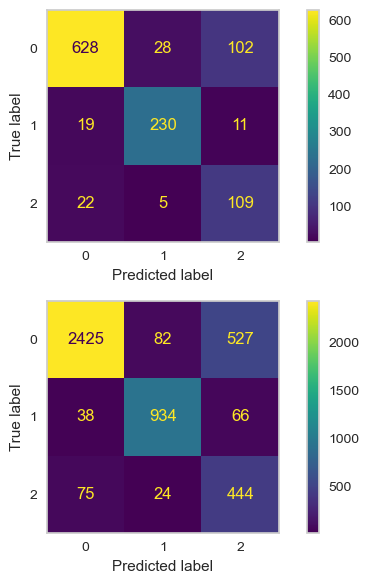

In [121]:
out_score_dt_shap = eval_metric_classification(
    grid_model, X_train_shap, y_train_shap, X_test_shap, y_test_shap, 
    'SHAP Decision Tree', average=None, labels=[2]
)
out_score_dt_shap

## ROC (Receiver Operating Curve) and AUC (Area Under Curve)

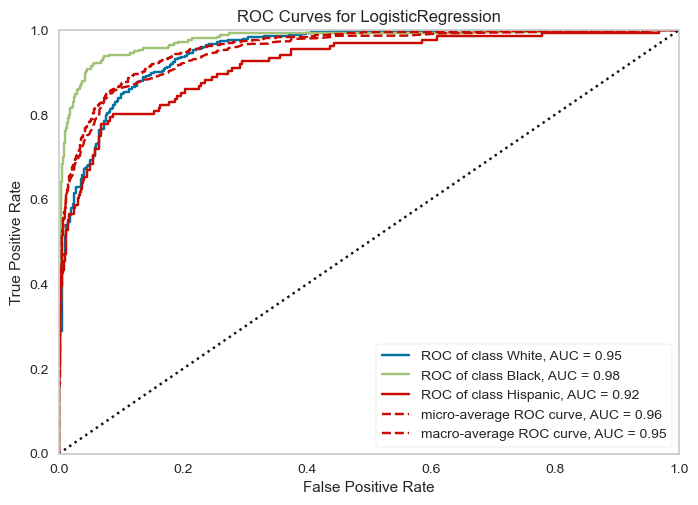

In [122]:
from yellowbrick.classifier import ROCAUC
model = pipe_log_shap

visualizer = ROCAUC(model, encoder={0: 'White', 1: 'Black', 2: 'Hispanic'})
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show(); 

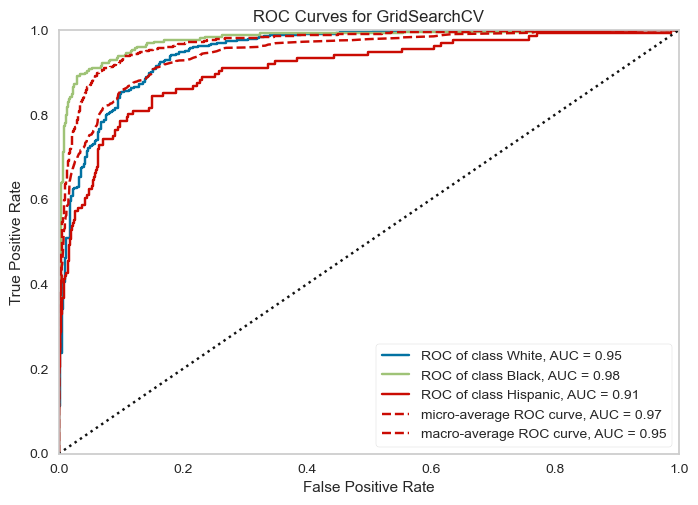

In [123]:
from yellowbrick.classifier import ROCAUC
model = grid_model

visualizer = ROCAUC(model, encoder={0: 'White', 1: 'Black', 2: 'Hispanic'})
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show(); 

In [124]:
# from yellowbrick.classifier import PrecisionRecallCurve

# model = pipe_log_shap
# viz = PrecisionRecallCurve(
#     model,
#     per_class=True, # classes= ["Black", "Hispanic", "White"],
#     cmap="Set1"
# )
# viz.fit(X_train_shap, y_train_shap)
# viz.score(X_test_shap, y_test_shap)
# viz.show();

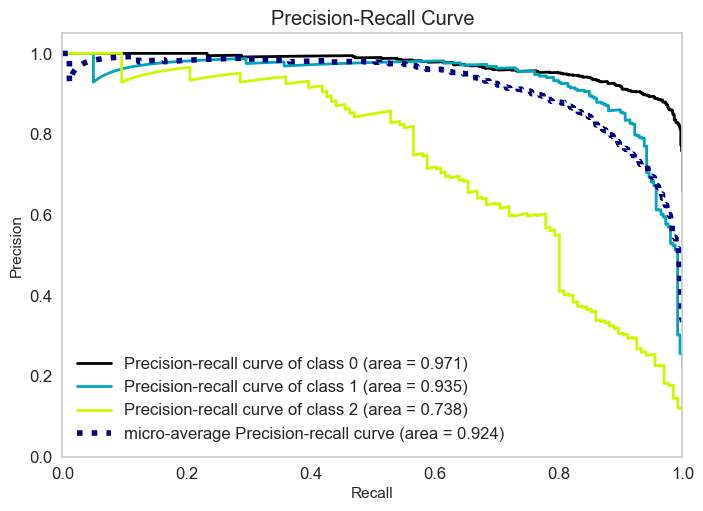

In [125]:
# !pip install scikit-plot
from scikitplot.metrics import plot_roc, precision_recall_curve
from scikitplot.metrics import plot_precision_recall

model = pipe_log_shap
model.fit(X_train_shap, y_train_shap)
y_pred_proba = model.predict_proba(X_test_shap)
plot_precision_recall(y_test_shap, y_pred_proba)
plt.show()

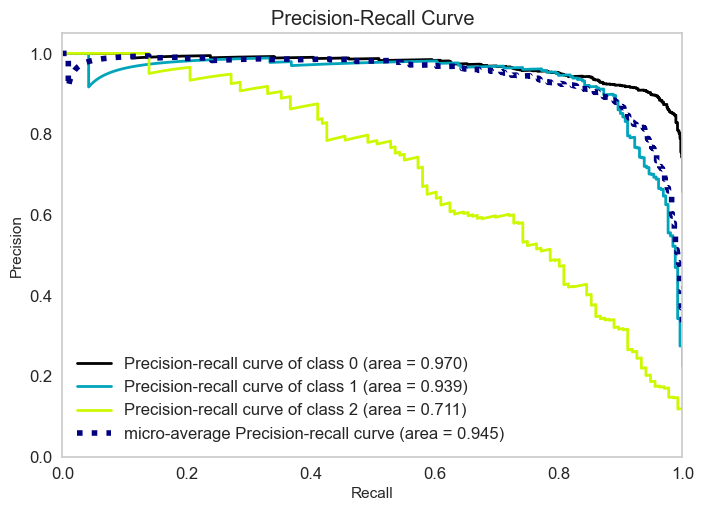

In [126]:
# !pip install scikit-plot
from scikitplot.metrics import plot_roc, precision_recall_curve
from scikitplot.metrics import plot_precision_recall

model = grid_model
model.fit(X_train_shap, y_train_shap)
y_pred_proba = model.predict_proba(X_test_shap)
plot_precision_recall(y_test_shap, y_pred_proba)
plt.show()

# Permutation Based Feature Importance (with scikit-learn)

- https://mljar.com/blog/feature-importance-xgboost/#:~:text=Xgboost%20is%20a%20gradient%20boosting,%2C%20R%2C%20Julia%2C%20Scala.

In [127]:
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipe_log_shap, X_test, y_test)

In [128]:
perm_importance.importances.shape,\
perm_importance.importances_mean.shape,\
perm_importance.importances_std.shape,

((97, 5), (97,), (97,))

In [129]:
X_test.columns.shape, perm_importance.importances_mean.shape

((97,), (97,))

Text(0.5, 0, 'Permutation Importance')

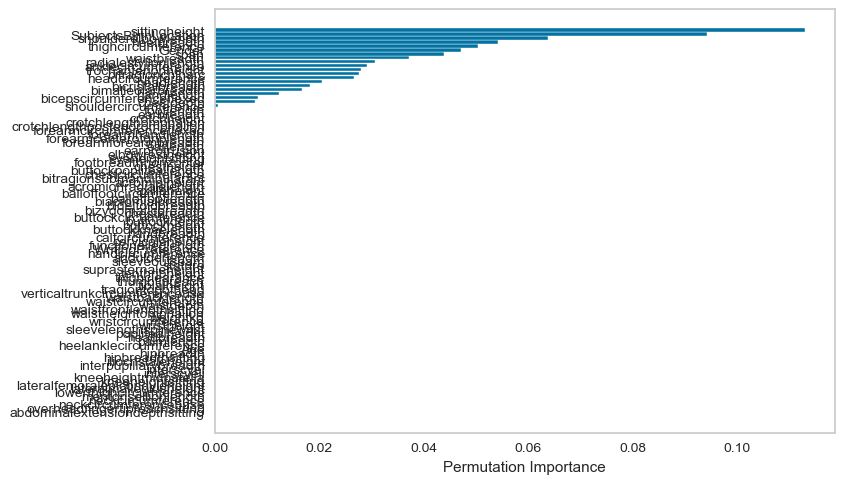

In [134]:
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(X_test.columns[sorted_idx][:], perm_importance.importances_mean[sorted_idx][:])
plt.xlabel("Permutation Importance")

Text(0.5, 0, 'Permutation Importance')

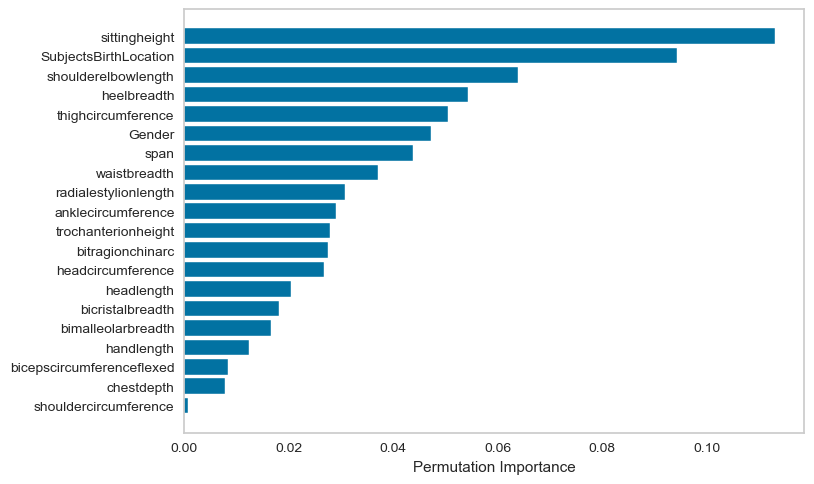

In [132]:
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(X_test.columns[sorted_idx][-20:], perm_importance.importances_mean[sorted_idx][-20:])
plt.xlabel("Permutation Importance")

In [130]:
print(feature_importance_list)

['SubjectsBirthLocation', 'Gender', 'thighcircumference', 'sittingheight', 'shouldercircumference', 'heelbreadth', 'radialestylionlength', 'span', 'bitragionchinarc', 'shoulderelbowlength', 'waistbreadth', 'anklecircumference', 'bicepscircumferenceflexed', 'trochanterionheight', 'headcircumference', 'handlength', 'chestdepth', 'bimalleolarbreadth', 'headlength', 'bicristalbreadth']


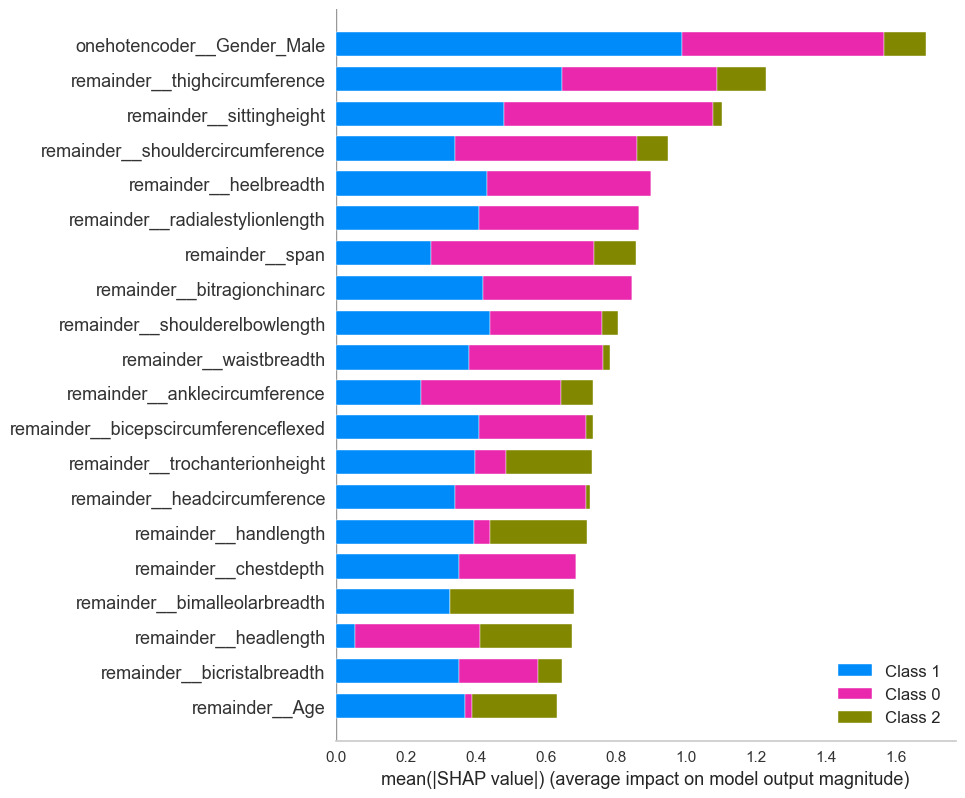

In [135]:
shap.summary_plot(
    shap_values, X_test_trans, 
    feature_names = features,
    max_display=20,
)

# Before the Deployment 
- Choose the model that works best based on your chosen metric
- For final step, fit the best model with whole dataset to get better performance.
- And your model ready to deploy, dump your model and scaler.

{'log__C': 4.5,
 'log__class_weight': 'balanced',
 'log__penalty': 'l1',
 'log__solver': 'saga'}

In [136]:
df = pd.read_csv("ansurII_2.csv")
df.shape

X = df[feature_importance_list]
y = df['DODRace']

In [137]:
X

,SubjectsBirthLocation,Gender,thighcircumference,sittingheight,shouldercircumference,heelbreadth,radialestylionlength,span,bitragionchinarc,shoulderelbowlength,waistbreadth,anklecircumference,bicepscircumferenceflexed,trochanterionheight,headcircumference,handlength,chestdepth,bimalleolarbreadth,headlength,bicristalbreadth
0,Germany,Female,622,803,1062,69,235,1647,338,327,295,204,315,844,548,184,245,65,191,263
1,California,Female,524,835,1014,60,259,1751,294,346,254,207,272,901,535,189,206,64,180,250
2,Texas,Female,577,904,1049,70,258,1779,309,362,269,233,300,882,588,195,223,69,207,276
3,District of Columbia,Female,679,875,1121,68,250,1708,340,333,302,214,364,866,593,186,285,68,206,276
4,Texas,Female,766,824,1151,63,242,1702,300,329,405,214,320,800,522,187,290,67,181,336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5764,Colorado,Male,579,883,1096,69,259,1688,321,348,279,216,318,869,554,182,238,70,187,241
5765,Oklahoma,Male,662,938,1199,67,265,1818,319,356,351,234,374,886,558,191,242,76,196,284
5766,Oklahoma,Male,605,895,1181,74,257,1642,323,333,333,227,367,858,555,183,247,74,194,271
5767,Oklahoma,Male,544,900,1162,65,254,1760,342,358,293,223,365,886,560,192,228,75,197,271


In [138]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

cat = X.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)
log_model = LogisticRegression(
    penalty='l1',  solver='saga', 
    C=4.5, class_weight='balanced',
    random_state=random_state
)
# pipeline for Logistic Regression
final_model = Pipeline([
    ("OneHotEncoder",column_trans),
    ("log", log_model)
])
final_model.fit(X, y)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['SubjectsBirthLocation',
                                                   'Gender'])])),
                ('log',
                 LogisticRegression(C=4.5, class_weight='balanced',
                                    penalty='l1', random_state=42,
                                    solver='saga'))])

In [139]:
y[0], final_model.predict(X.loc[[0]])

(2, array([2], dtype=int64))

In [140]:
y[99], final_model.predict(X.loc[[99]])

(1, array([3], dtype=int64))

In [141]:
y[999], final_model.predict(X.loc[[999]])

(3, array([3], dtype=int64))

In [142]:
# mean_human = X.describe(include="all").loc["mean"]
mean_human = X.mean()
mean_human

thighcircumference           623.5836
sittingheight                898.5925
shouldercircumference       1131.2144
heelbreadth                   70.8341
radialestylionlength         259.7577
span                        1766.9511
bitragionchinarc             324.9622
shoulderelbowlength          354.8052
waistbreadth                 318.4099
anklecircumference           225.2018
bicepscircumferenceflexed    341.6630
trochanterionheight          884.6594
headcircumference            570.4243
handlength                   189.5748
chestdepth                   252.3226
bimalleolarbreadth            72.3354
headlength                   196.6408
bicristalbreadth             274.9034
dtype: float64

In [143]:
X.describe(include='O').T

,count,unique,top,freq
SubjectsBirthLocation,5769,136,California,417
Gender,5769,2,Male,3899


In [144]:
mean_human["Gender"] = "Male"
mean_human["SubjectsBirthLocation"] = "California"
mean_human 

thighcircumference             623.5836
sittingheight                  898.5925
shouldercircumference         1131.2144
heelbreadth                     70.8341
radialestylionlength           259.7577
span                          1766.9511
bitragionchinarc               324.9622
shoulderelbowlength            354.8052
waistbreadth                   318.4099
anklecircumference             225.2018
bicepscircumferenceflexed      341.6630
trochanterionheight            884.6594
headcircumference              570.4243
handlength                     189.5748
chestdepth                     252.3226
bimalleolarbreadth              72.3354
headlength                     196.6408
bicristalbreadth               274.9034
Gender                             Male
SubjectsBirthLocation        California
dtype: object

In [145]:
final_model.predict(pd.DataFrame(mean_human).T)

array([3], dtype=int64)

In [146]:
from sklearn.metrics import matthews_corrcoef

y_pred = final_model.predict(X)

matthews_corrcoef(y, y_pred)

0.728381771618086

In [147]:
from sklearn.metrics import cohen_kappa_score

cohen_kappa_score(y, y_pred)

0.7171096460169646

In [148]:
print(mean_human.to_dict())

{'thighcircumference': 623.5836366788005, 'sittingheight': 898.5924770324146, 'shouldercircumference': 1131.2144219102097, 'heelbreadth': 70.83411336453459, 'radialestylionlength': 259.75767030681226, 'span': 1766.9511180447219, 'bitragionchinarc': 324.9622118218062, 'shoulderelbowlength': 354.80516553995494, 'waistbreadth': 318.40994973132257, 'anklecircumference': 225.20176807072284, 'bicepscircumferenceflexed': 341.66302652106083, 'trochanterionheight': 884.659386375455, 'headcircumference': 570.424336973479, 'handlength': 189.57479632518633, 'chestdepth': 252.3225862367828, 'bimalleolarbreadth': 72.33541341653667, 'headlength': 196.640838966892, 'bicristalbreadth': 274.9034494713122, 'Gender': 'Male', 'SubjectsBirthLocation': 'California'}


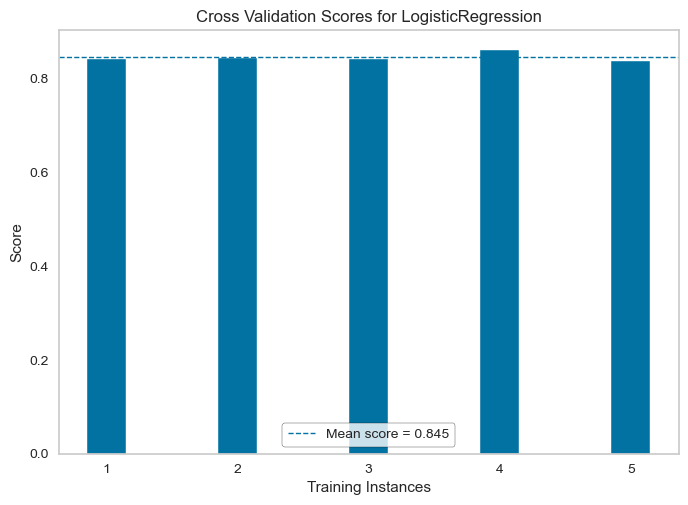

<AxesSubplot:title={'center':'Cross Validation Scores for LogisticRegression'}, xlabel='Training Instances', ylabel='Score'>

In [149]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import MultinomialNB
from yellowbrick.model_selection import CVScores

cat = X.select_dtypes("object").columns.to_list()
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat),
    remainder=MinMaxScaler()
)
log_model = LogisticRegression(
    penalty='l1',  solver='saga', 
    C=4.5, class_weight='balanced',
    random_state=42
)
# pipeline for Logistic Regression
model = Pipeline([
    ("OneHotEncoder",column_trans),
    ("log", log_model)
])

# Create a cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Instantiate the classification model and visualizer
model = model
visualizer = CVScores(model, cv=cv, scoring='f1_weighted')

visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

# Model Deployment

## Save Model

In [150]:
import pickle
pickle.dump(final_model, open("final_model_hearing", 'wb'))

## Use saved Model

In [151]:
import pickle
final_model_hearing = pickle.load(open("final_model_hearing", "rb"))

In [152]:
import pandas as pd

mean_human = pd.DataFrame.from_dict(
    {'thighcircumference': 623.5836366788005, 'sittingheight': 898.5924770324146, 'shouldercircumference': 1131.2144219102097, 
     'heelbreadth': 70.83411336453459, 'radialestylionlength': 259.75767030681226, 'span': 1766.9511180447219, 
     'bitragionchinarc': 324.9622118218062, 'shoulderelbowlength': 354.80516553995494, 'waistbreadth': 318.40994973132257, 
     'anklecircumference': 225.20176807072284, 'bicepscircumferenceflexed': 341.66302652106083, 
     'trochanterionheight': 884.659386375455, 'headcircumference': 570.424336973479, 'handlength': 189.57479632518633, 
     'chestdepth': 252.3225862367828, 'bimalleolarbreadth': 72.33541341653667, 'headlength': 196.640838966892, 
     'bicristalbreadth': 274.9034494713122, 'Gender': 'Male', 'SubjectsBirthLocation': 'California'}, orient='index'
).T
mean_human

,thighcircumference,sittingheight,shouldercircumference,heelbreadth,radialestylionlength,span,bitragionchinarc,shoulderelbowlength,waistbreadth,anklecircumference,bicepscircumferenceflexed,trochanterionheight,headcircumference,handlength,chestdepth,bimalleolarbreadth,headlength,bicristalbreadth,Gender,SubjectsBirthLocation
0,623.5836,898.5925,1131.2144,70.8341,259.7577,1766.9511,324.9622,354.8052,318.4099,225.2018,341.6630,884.6594,570.4243,189.5748,252.3226,72.3354,196.6408,274.9034,Male,California


In [153]:
final_model_hearing.predict(mean_human)

array([3], dtype=int64)

<a id="10"></a>

<p style="background-color:romance; color:plum; font-size:275%; text-align:center; border-radius:10px 10px; font-family:newtimeroman; line-height:1.4; font-weight:bold; text-transform: title;">The End of the Project</p>

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" 
alt="CLRSWY" style="display:block; margin:auto;"></p>

<p style="background-color:romance; color:plum; font-size:165%; text-align:center; border-radius:10px 10px; font-family:newtimeroman; line-height:1.4; font-weight:bold; text-transform: uppercase;">WAY TO REINVENT YOURSELF</p>